In [1]:
!pip uninstall tensorflow
!pip install tensorflow-gpu==2.0

In [2]:
!git clone https://github.com/Saadali190/CS231n.git
%cd CS231n/assignment3

fatal: destination path 'CS231n' already exists and is not an empty directory.
/content/CS231n/assignment3


# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](https://github.com/Saadali190/CS231n/blob/master/assignment3/gan_outputs_tf.png?raw=1)


## Setup

In [0]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [0]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

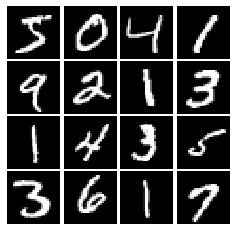

In [5]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [0]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return tf.maximum(alpha*x ,x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [7]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [0]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform((batch_size, dim), minval=-1, maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [9]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [0]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(256, input_shape=(784,)),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1),

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [11]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [0]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024, input_shape=(noise_dim,) ,  activation='relu'),
        tf.keras.layers.Dense(1024, activation='relu'),
        tf.keras.layers.Dense(784, activation='tanh'),

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [13]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [0]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    N = logits_real.shape[0]
    binary_crsentrpy = tf.keras.losses.BinaryCrossentropy(from_logits=True) 
    rloss = binary_crsentrpy(tf.ones(N,), logits_real)
    floss = binary_crsentrpy(tf.zeros(logits_fake.shape[0],), logits_fake)
    loss = tf.reduce_mean(rloss+floss)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    binary_crsentrpy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    floss = binary_crsentrpy(tf.ones(logits_fake.shape[0],), logits_fake)
    loss = tf.reduce_mean(floss)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [15]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [16]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [0]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    G_solver = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [0]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.27, G:0.7298
Instructions for updating:
Use tf.identity instead.


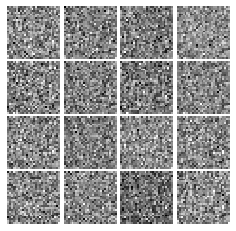

Epoch: 0, Iter: 20, D: 0.5936, G:0.9672


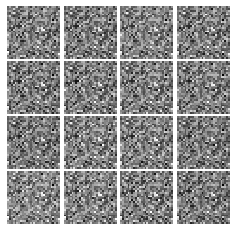

Epoch: 0, Iter: 40, D: 0.5216, G:1.19


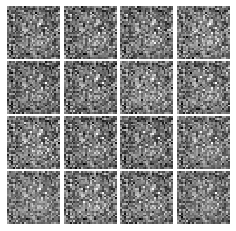

Epoch: 0, Iter: 60, D: 1.158, G:1.396


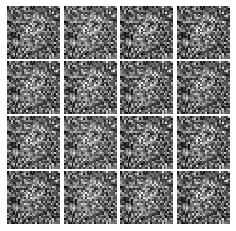

Epoch: 0, Iter: 80, D: 1.201, G:0.8906


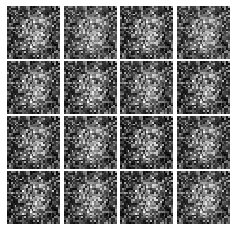

Epoch: 0, Iter: 100, D: 1.314, G:0.9522


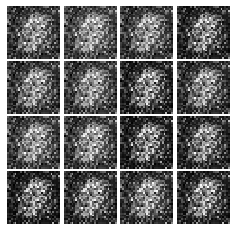

Epoch: 0, Iter: 120, D: 1.268, G:0.6713


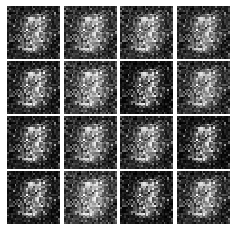

Epoch: 0, Iter: 140, D: 1.003, G:1.146


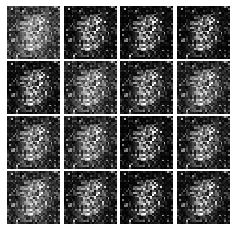

Epoch: 0, Iter: 160, D: 0.9808, G:1.295


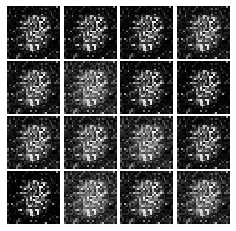

Epoch: 0, Iter: 180, D: 1.381, G:1.439


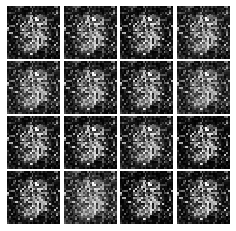

Epoch: 0, Iter: 200, D: 1.41, G:1.145


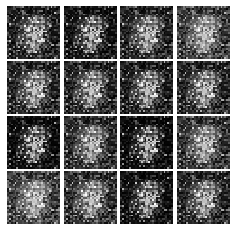

Epoch: 0, Iter: 220, D: 1.251, G:1.303


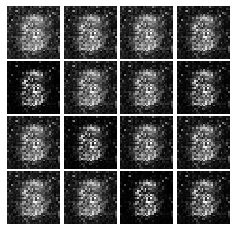

Epoch: 0, Iter: 240, D: 1.064, G:1.25


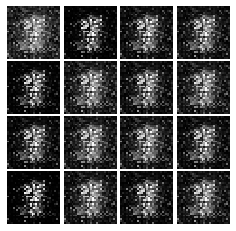

Epoch: 0, Iter: 260, D: 0.7071, G:2.076


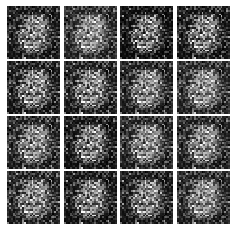

Epoch: 0, Iter: 280, D: 2.054, G:0.7364


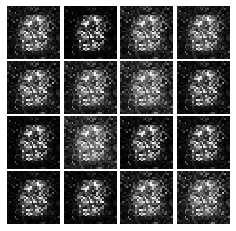

Epoch: 0, Iter: 300, D: 1.801, G:1.356


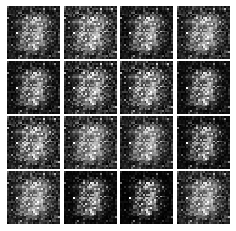

Epoch: 0, Iter: 320, D: 1.49, G:0.8369


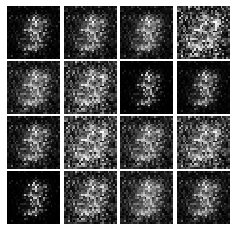

Epoch: 0, Iter: 340, D: 1.564, G:0.1586


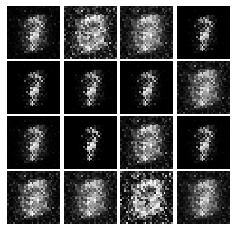

Epoch: 0, Iter: 360, D: 1.27, G:2.828


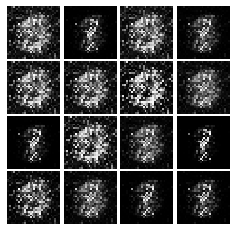

Epoch: 0, Iter: 380, D: 0.8764, G:1.43


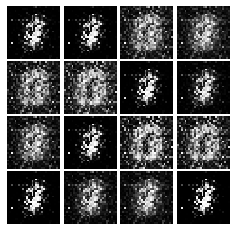

Epoch: 0, Iter: 400, D: 0.8738, G:1.479


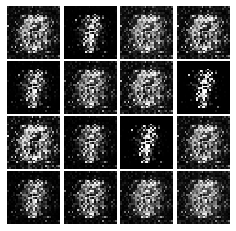

Epoch: 0, Iter: 420, D: 0.8223, G:1.259


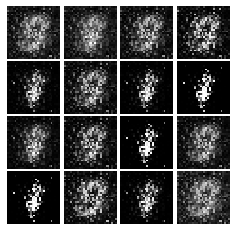

Epoch: 0, Iter: 440, D: 1.834, G:0.3455


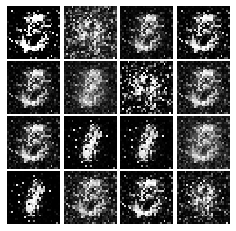

Epoch: 0, Iter: 460, D: 1.207, G:1.146


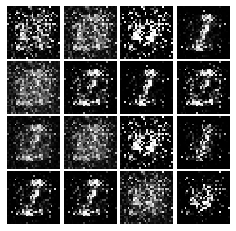

Epoch: 1, Iter: 480, D: 1.034, G:1.415


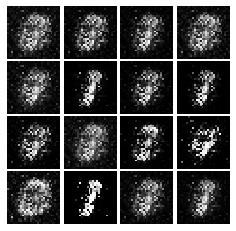

Epoch: 1, Iter: 500, D: 1.099, G:0.656


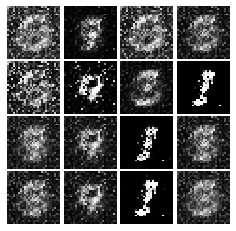

Epoch: 1, Iter: 520, D: 1.096, G:1.832


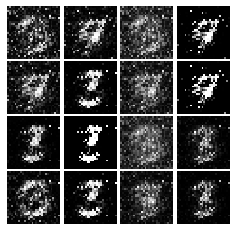

Epoch: 1, Iter: 540, D: 1.055, G:1.099


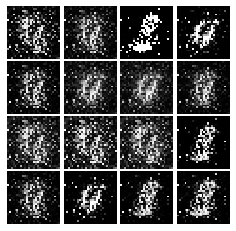

Epoch: 1, Iter: 560, D: 0.8468, G:1.757


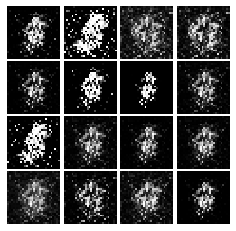

Epoch: 1, Iter: 580, D: 0.8924, G:2.075


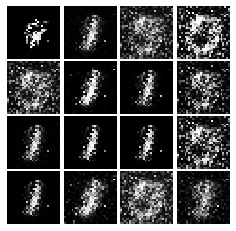

Epoch: 1, Iter: 600, D: 2.427, G:1.247


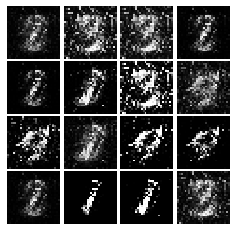

Epoch: 1, Iter: 620, D: 0.8684, G:2.188


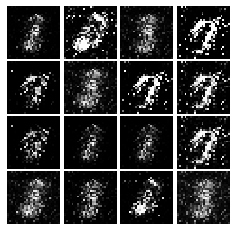

Epoch: 1, Iter: 640, D: 1.218, G:2.163


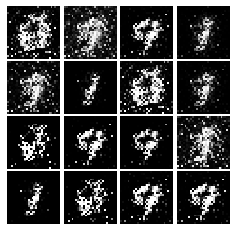

Epoch: 1, Iter: 660, D: 0.8617, G:2.861


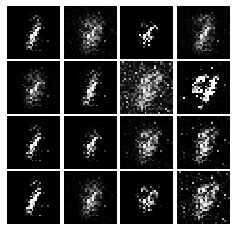

Epoch: 1, Iter: 680, D: 0.9812, G:1.142


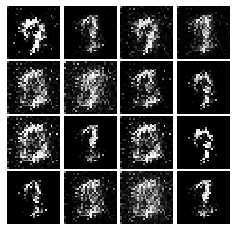

Epoch: 1, Iter: 700, D: 1.195, G:2.307


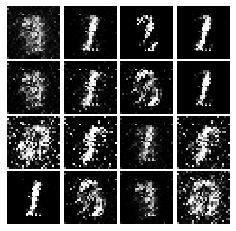

Epoch: 1, Iter: 720, D: 1.204, G:1.052


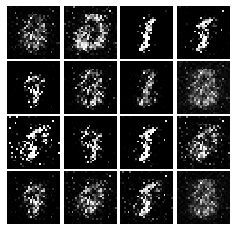

Epoch: 1, Iter: 740, D: 1.962, G:0.146


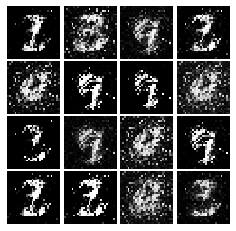

Epoch: 1, Iter: 760, D: 0.9378, G:1.42


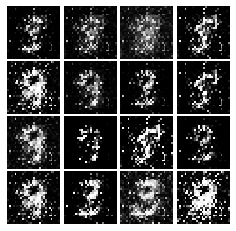

Epoch: 1, Iter: 780, D: 1.015, G:1.224


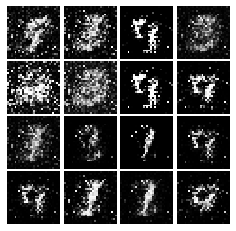

Epoch: 1, Iter: 800, D: 1.262, G:1.032


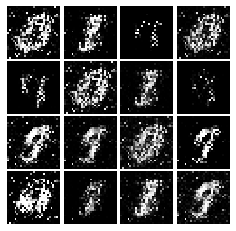

Epoch: 1, Iter: 820, D: 1.249, G:2.304


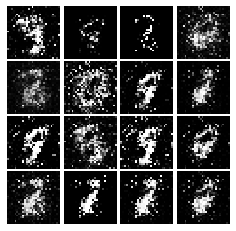

Epoch: 1, Iter: 840, D: 1.172, G:1.259


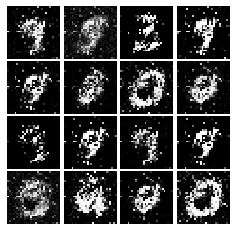

Epoch: 1, Iter: 860, D: 1.303, G:0.9761


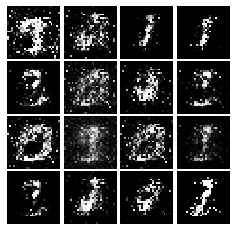

Epoch: 1, Iter: 880, D: 1.087, G:5.749


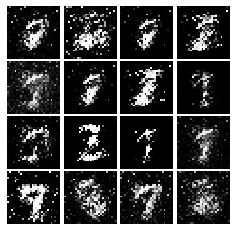

Epoch: 1, Iter: 900, D: 2.264, G:0.7511


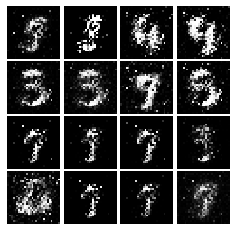

Epoch: 1, Iter: 920, D: 1.29, G:0.8732


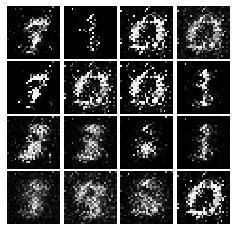

Epoch: 2, Iter: 940, D: 1.121, G:1.453


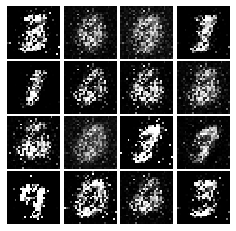

Epoch: 2, Iter: 960, D: 1.151, G:1.54


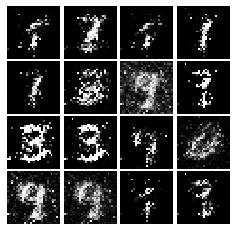

Epoch: 2, Iter: 980, D: 1.13, G:1.809


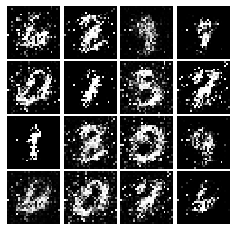

Epoch: 2, Iter: 1000, D: 1.202, G:1.224


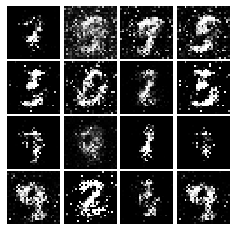

Epoch: 2, Iter: 1020, D: 1.507, G:0.9772


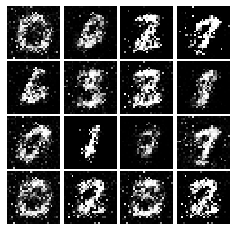

Epoch: 2, Iter: 1040, D: 1.196, G:0.79


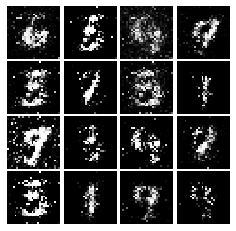

Epoch: 2, Iter: 1060, D: 1.076, G:0.9496


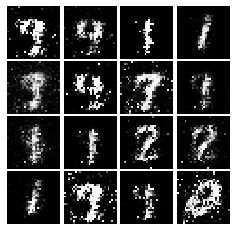

Epoch: 2, Iter: 1080, D: 1.255, G:0.9024


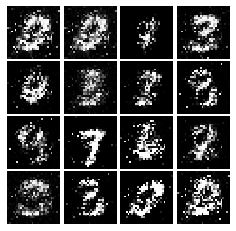

Epoch: 2, Iter: 1100, D: 1.331, G:1.762


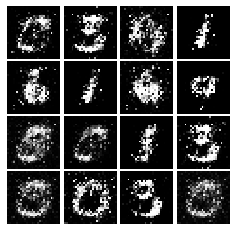

Epoch: 2, Iter: 1120, D: 1.251, G:0.9434


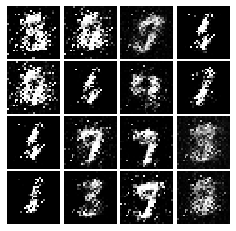

Epoch: 2, Iter: 1140, D: 1.378, G:0.8222


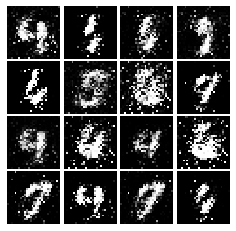

Epoch: 2, Iter: 1160, D: 1.149, G:0.9498


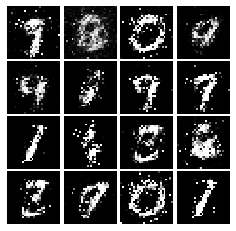

Epoch: 2, Iter: 1180, D: 1.224, G:0.9019


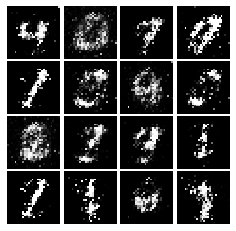

Epoch: 2, Iter: 1200, D: 1.407, G:0.8534


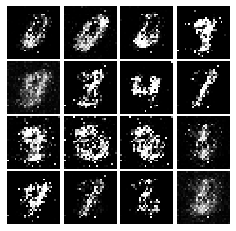

Epoch: 2, Iter: 1220, D: 1.191, G:0.9721


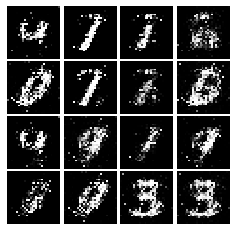

Epoch: 2, Iter: 1240, D: 1.168, G:1.223


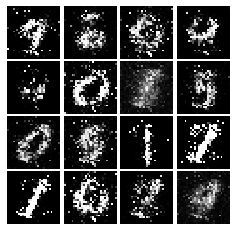

Epoch: 2, Iter: 1260, D: 1.293, G:0.8246


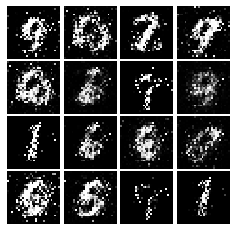

Epoch: 2, Iter: 1280, D: 1.205, G:1.069


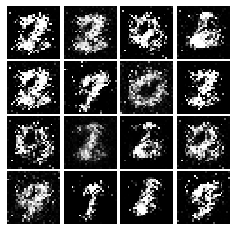

Epoch: 2, Iter: 1300, D: 1.139, G:0.909


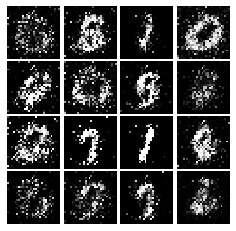

Epoch: 2, Iter: 1320, D: 1.305, G:0.8587


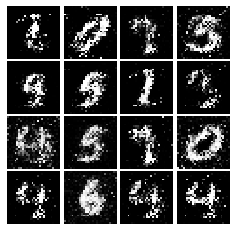

Epoch: 2, Iter: 1340, D: 1.214, G:0.9699


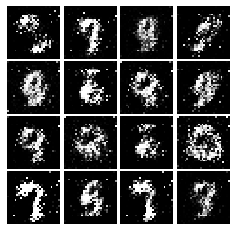

Epoch: 2, Iter: 1360, D: 1.306, G:0.9706


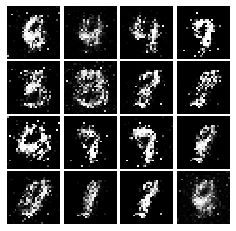

Epoch: 2, Iter: 1380, D: 1.192, G:1.105


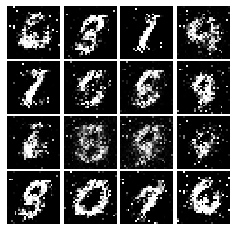

Epoch: 2, Iter: 1400, D: 1.236, G:0.998


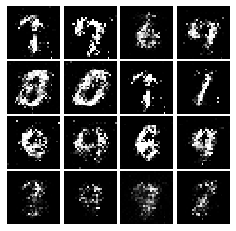

Epoch: 3, Iter: 1420, D: 1.368, G:1.32


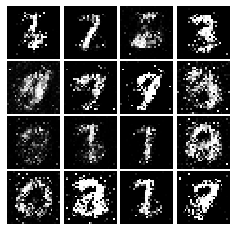

Epoch: 3, Iter: 1440, D: 1.267, G:0.9988


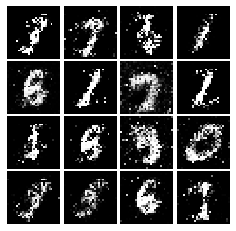

Epoch: 3, Iter: 1460, D: 1.708, G:0.3563


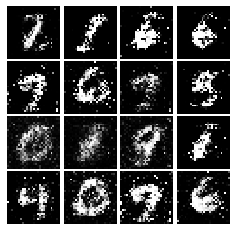

Epoch: 3, Iter: 1480, D: 1.549, G:0.8525


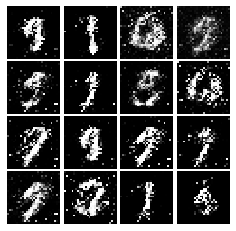

Epoch: 3, Iter: 1500, D: 1.26, G:0.9629


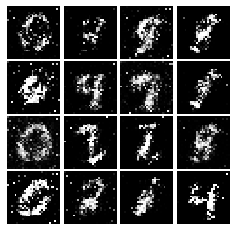

Epoch: 3, Iter: 1520, D: 1.318, G:0.7572


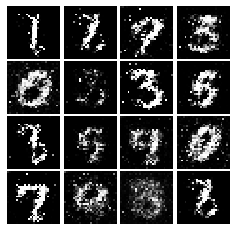

Epoch: 3, Iter: 1540, D: 1.251, G:1.061


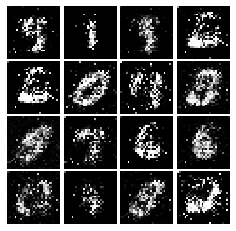

Epoch: 3, Iter: 1560, D: 1.21, G:1.072


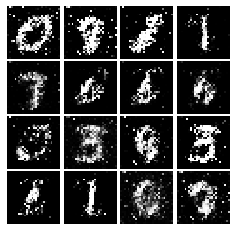

Epoch: 3, Iter: 1580, D: 1.387, G:1.053


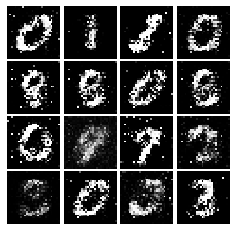

Epoch: 3, Iter: 1600, D: 1.308, G:0.9589


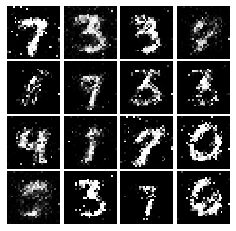

Epoch: 3, Iter: 1620, D: 1.289, G:0.9011


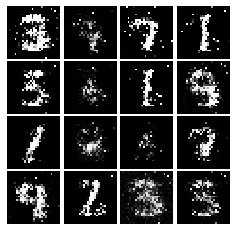

Epoch: 3, Iter: 1640, D: 1.279, G:0.9253


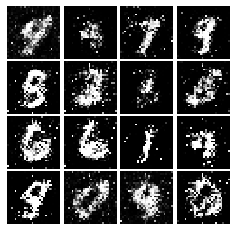

Epoch: 3, Iter: 1660, D: 1.134, G:1.172


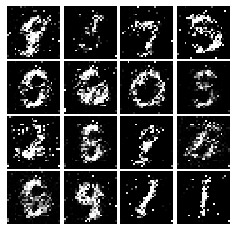

Epoch: 3, Iter: 1680, D: 1.19, G:0.8874


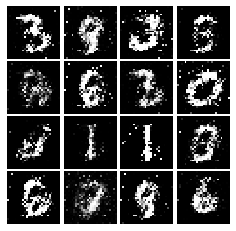

Epoch: 3, Iter: 1700, D: 1.534, G:0.8812


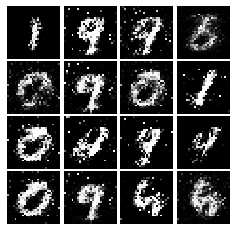

Epoch: 3, Iter: 1720, D: 1.202, G:1.004


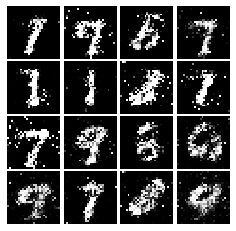

Epoch: 3, Iter: 1740, D: 1.198, G:0.8471


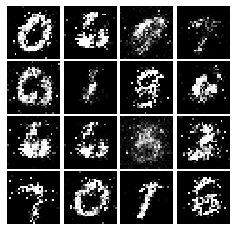

Epoch: 3, Iter: 1760, D: 1.211, G:0.9895


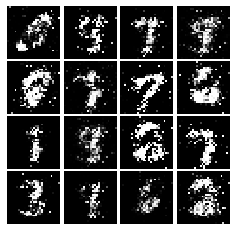

Epoch: 3, Iter: 1780, D: 1.269, G:0.8525


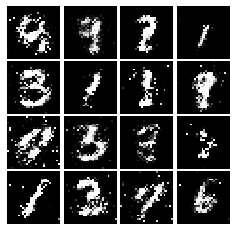

Epoch: 3, Iter: 1800, D: 1.208, G:0.9587


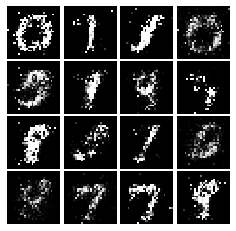

Epoch: 3, Iter: 1820, D: 1.424, G:0.8711


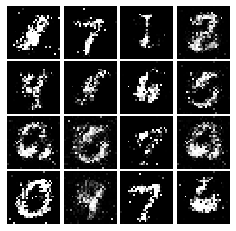

Epoch: 3, Iter: 1840, D: 1.247, G:0.9777


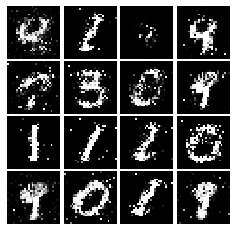

Epoch: 3, Iter: 1860, D: 1.243, G:0.7627


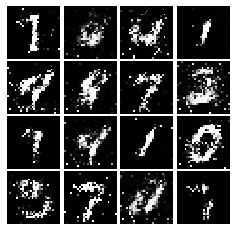

Epoch: 4, Iter: 1880, D: 1.299, G:0.9403


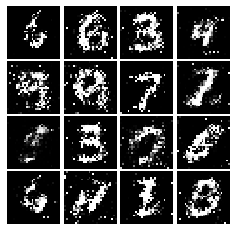

Epoch: 4, Iter: 1900, D: 1.257, G:0.8793


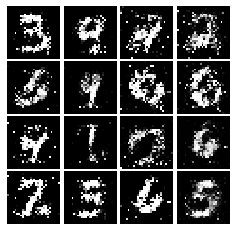

Epoch: 4, Iter: 1920, D: 1.263, G:0.907


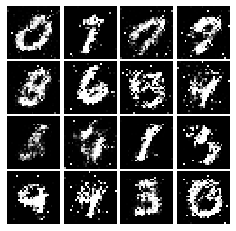

Epoch: 4, Iter: 1940, D: 1.202, G:0.9436


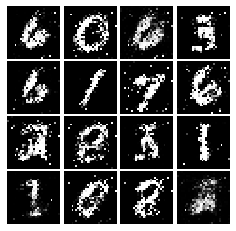

Epoch: 4, Iter: 1960, D: 1.151, G:1.005


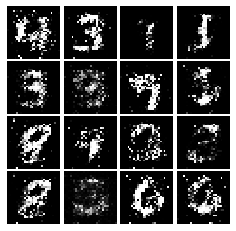

Epoch: 4, Iter: 1980, D: 1.255, G:1.021


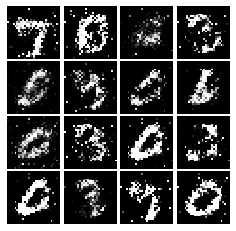

Epoch: 4, Iter: 2000, D: 1.353, G:0.8401


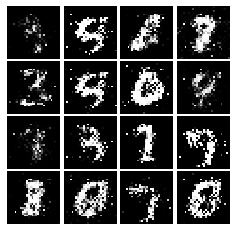

Epoch: 4, Iter: 2020, D: 1.262, G:0.9661


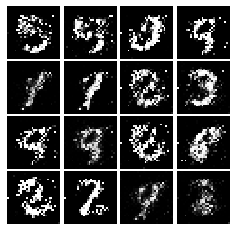

Epoch: 4, Iter: 2040, D: 1.295, G:0.9721


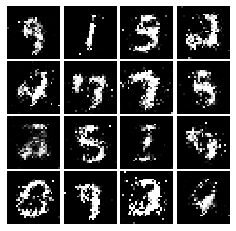

Epoch: 4, Iter: 2060, D: 1.268, G:1.177


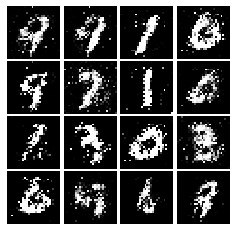

Epoch: 4, Iter: 2080, D: 1.357, G:0.9179


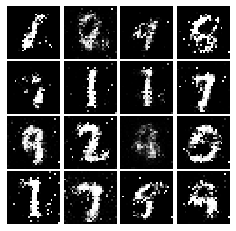

Epoch: 4, Iter: 2100, D: 1.3, G:1.066


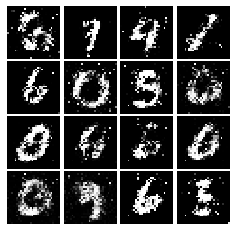

Epoch: 4, Iter: 2120, D: 1.296, G:0.8813


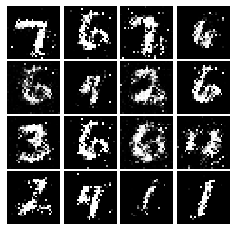

Epoch: 4, Iter: 2140, D: 1.315, G:0.9081


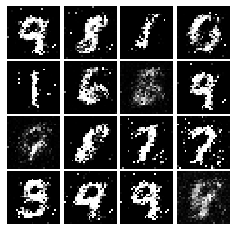

Epoch: 4, Iter: 2160, D: 1.422, G:0.9097


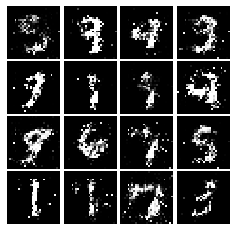

Epoch: 4, Iter: 2180, D: 1.317, G:0.8473


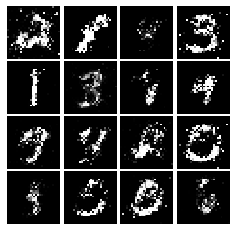

Epoch: 4, Iter: 2200, D: 1.2, G:0.8795


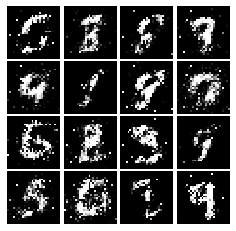

Epoch: 4, Iter: 2220, D: 1.292, G:0.8152


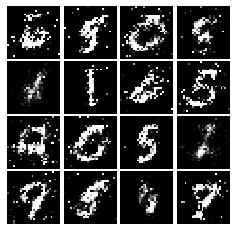

Epoch: 4, Iter: 2240, D: 1.459, G:1.041


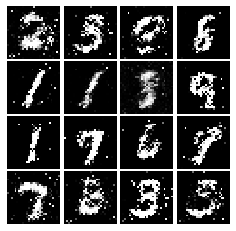

Epoch: 4, Iter: 2260, D: 1.238, G:1.119


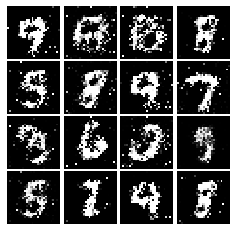

Epoch: 4, Iter: 2280, D: 1.371, G:1.125


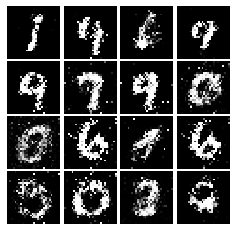

Epoch: 4, Iter: 2300, D: 1.334, G:0.801


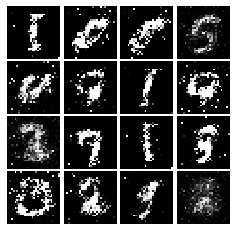

Epoch: 4, Iter: 2320, D: 1.219, G:0.8381


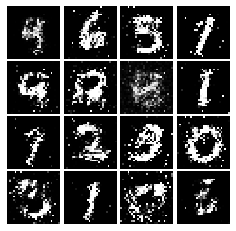

Epoch: 4, Iter: 2340, D: 1.276, G:0.8236


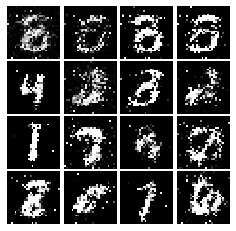

Epoch: 5, Iter: 2360, D: 1.236, G:0.9866


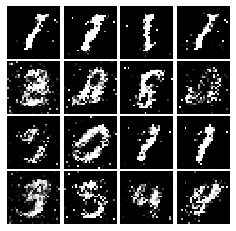

Epoch: 5, Iter: 2380, D: 1.341, G:0.7649


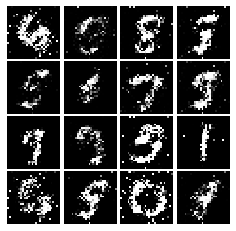

Epoch: 5, Iter: 2400, D: 1.214, G:1.136


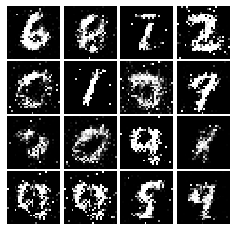

Epoch: 5, Iter: 2420, D: 1.391, G:1.088


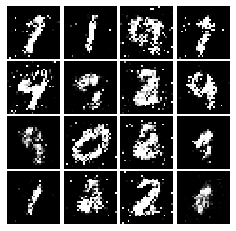

Epoch: 5, Iter: 2440, D: 1.353, G:0.9062


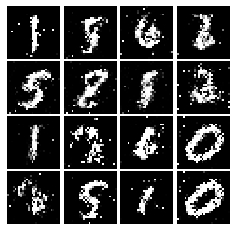

Epoch: 5, Iter: 2460, D: 1.097, G:0.9513


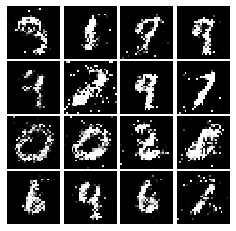

Epoch: 5, Iter: 2480, D: 1.247, G:1.051


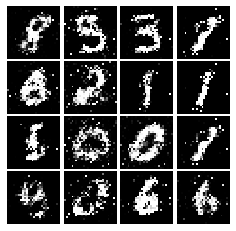

Epoch: 5, Iter: 2500, D: 1.18, G:1.05


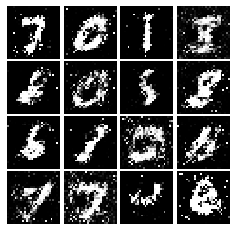

Epoch: 5, Iter: 2520, D: 1.436, G:0.9112


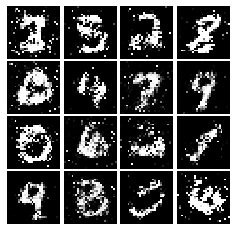

Epoch: 5, Iter: 2540, D: 1.323, G:0.7905


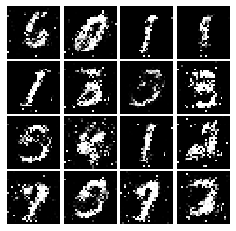

Epoch: 5, Iter: 2560, D: 1.31, G:0.9093


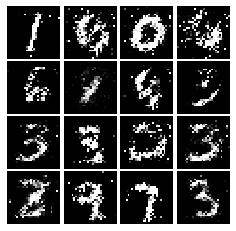

Epoch: 5, Iter: 2580, D: 1.362, G:0.8208


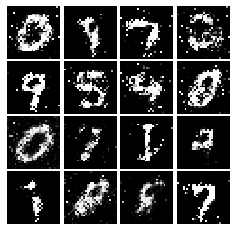

Epoch: 5, Iter: 2600, D: 1.613, G:0.8174


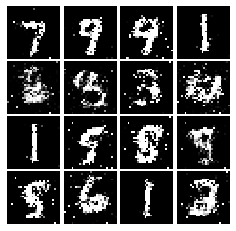

Epoch: 5, Iter: 2620, D: 1.323, G:0.8387


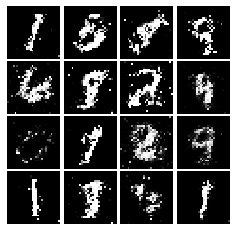

Epoch: 5, Iter: 2640, D: 1.371, G:0.9967


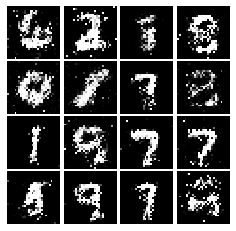

Epoch: 5, Iter: 2660, D: 1.355, G:0.9217


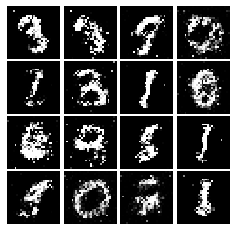

Epoch: 5, Iter: 2680, D: 1.361, G:0.9023


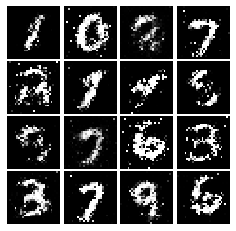

Epoch: 5, Iter: 2700, D: 1.407, G:0.8931


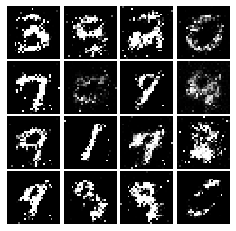

Epoch: 5, Iter: 2720, D: 1.286, G:0.8964


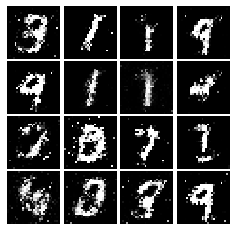

Epoch: 5, Iter: 2740, D: 1.266, G:0.9175


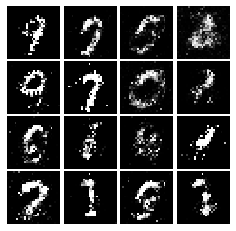

Epoch: 5, Iter: 2760, D: 1.269, G:0.8191


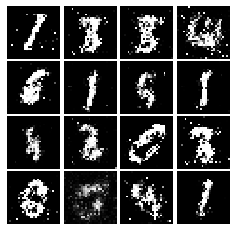

Epoch: 5, Iter: 2780, D: 1.246, G:0.645


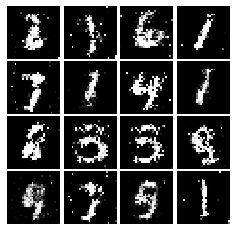

Epoch: 5, Iter: 2800, D: 1.287, G:0.8522


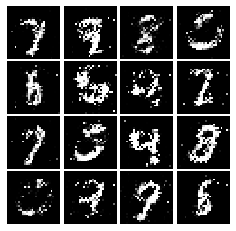

Epoch: 6, Iter: 2820, D: 1.317, G:0.8588


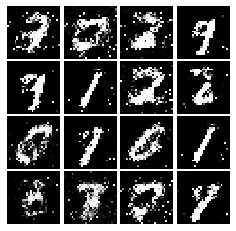

Epoch: 6, Iter: 2840, D: 1.195, G:0.8271


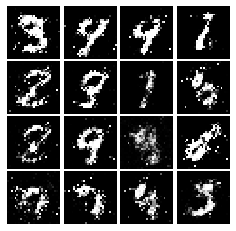

Epoch: 6, Iter: 2860, D: 1.534, G:0.6049


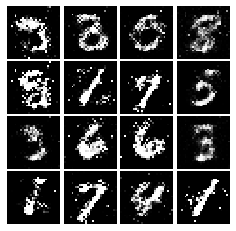

Epoch: 6, Iter: 2880, D: 1.163, G:0.8736


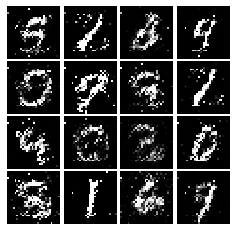

Epoch: 6, Iter: 2900, D: 1.341, G:0.8986


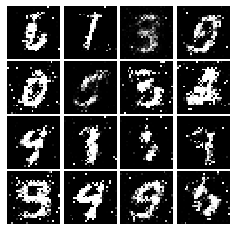

Epoch: 6, Iter: 2920, D: 1.341, G:0.8628


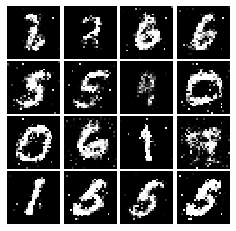

Epoch: 6, Iter: 2940, D: 1.319, G:0.9477


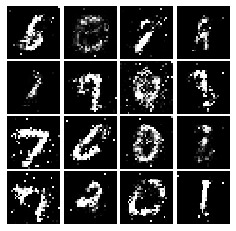

Epoch: 6, Iter: 2960, D: 1.369, G:0.9889


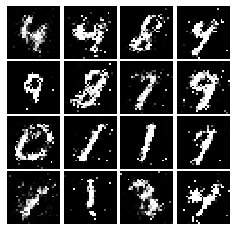

Epoch: 6, Iter: 2980, D: 1.31, G:0.7617


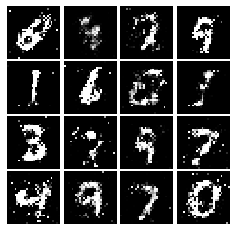

Epoch: 6, Iter: 3000, D: 1.255, G:0.8801


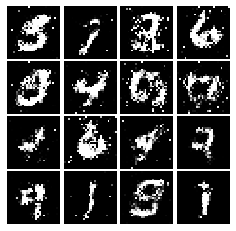

Epoch: 6, Iter: 3020, D: 1.261, G:0.8917


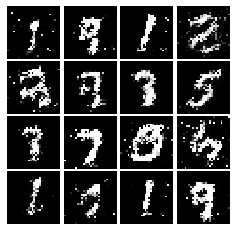

Epoch: 6, Iter: 3040, D: 1.245, G:0.9501


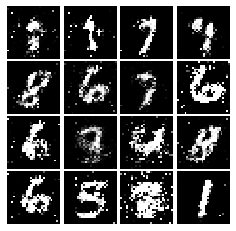

Epoch: 6, Iter: 3060, D: 1.327, G:0.775


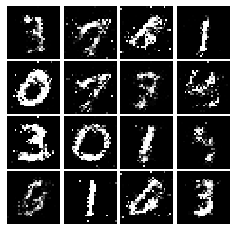

Epoch: 6, Iter: 3080, D: 1.276, G:0.8011


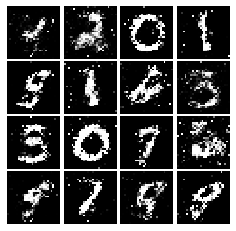

Epoch: 6, Iter: 3100, D: 1.163, G:0.9112


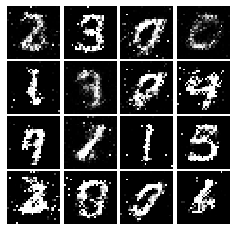

Epoch: 6, Iter: 3120, D: 1.195, G:0.8788


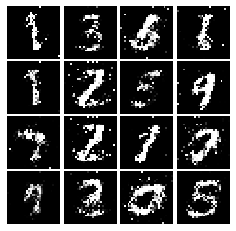

Epoch: 6, Iter: 3140, D: 1.251, G:0.8661


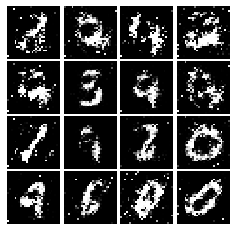

Epoch: 6, Iter: 3160, D: 1.307, G:0.7498


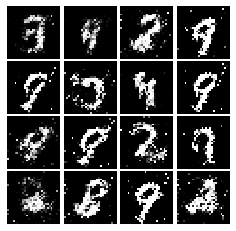

Epoch: 6, Iter: 3180, D: 1.281, G:0.8188


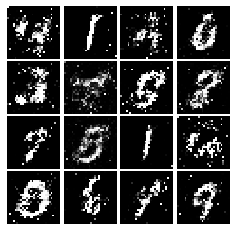

Epoch: 6, Iter: 3200, D: 1.26, G:0.8208


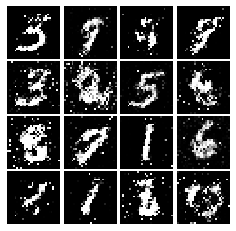

Epoch: 6, Iter: 3220, D: 1.321, G:0.892


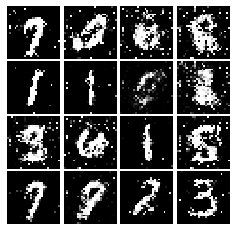

Epoch: 6, Iter: 3240, D: 1.264, G:0.823


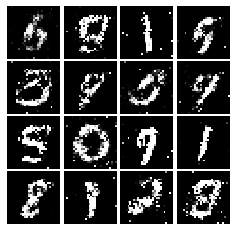

Epoch: 6, Iter: 3260, D: 1.372, G:0.8727


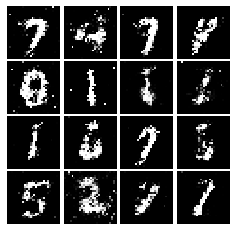

Epoch: 6, Iter: 3280, D: 1.364, G:0.7654


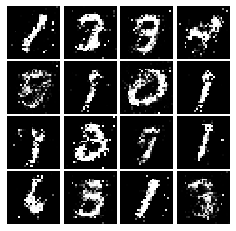

Epoch: 7, Iter: 3300, D: 1.239, G:0.9489


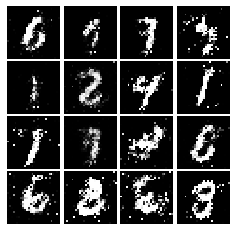

Epoch: 7, Iter: 3320, D: 1.227, G:0.9679


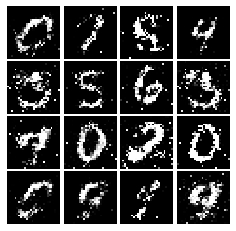

Epoch: 7, Iter: 3340, D: 1.342, G:0.9242


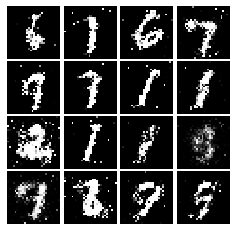

Epoch: 7, Iter: 3360, D: 1.342, G:0.8569


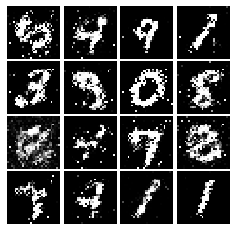

Epoch: 7, Iter: 3380, D: 1.401, G:0.9353


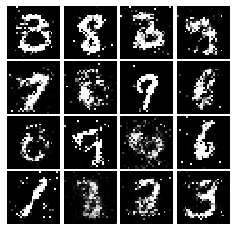

Epoch: 7, Iter: 3400, D: 1.405, G:0.8401


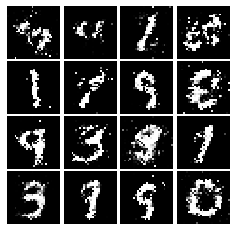

Epoch: 7, Iter: 3420, D: 1.322, G:0.894


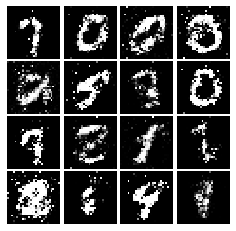

Epoch: 7, Iter: 3440, D: 1.359, G:0.7723


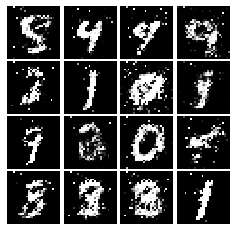

Epoch: 7, Iter: 3460, D: 1.283, G:0.849


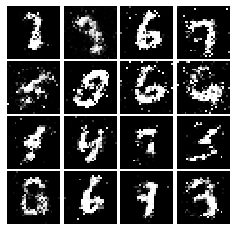

Epoch: 7, Iter: 3480, D: 1.355, G:0.7688


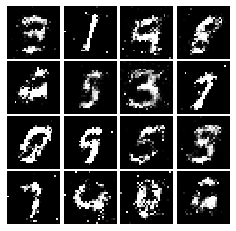

Epoch: 7, Iter: 3500, D: 1.295, G:0.7644


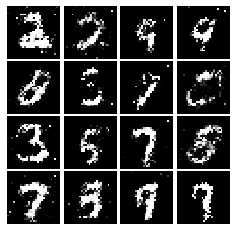

Epoch: 7, Iter: 3520, D: 1.419, G:0.7927


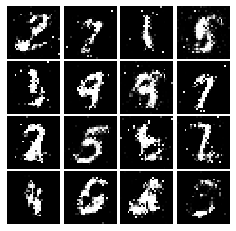

Epoch: 7, Iter: 3540, D: 1.267, G:0.8168


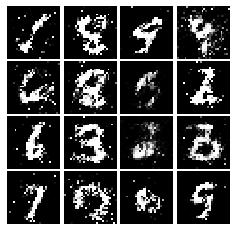

Epoch: 7, Iter: 3560, D: 1.364, G:0.8308


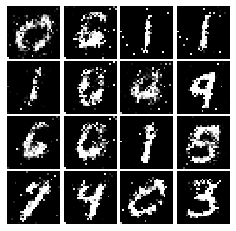

Epoch: 7, Iter: 3580, D: 1.345, G:0.8027


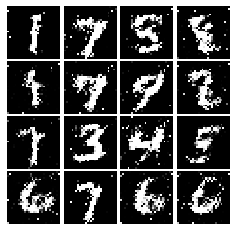

Epoch: 7, Iter: 3600, D: 1.34, G:0.8085


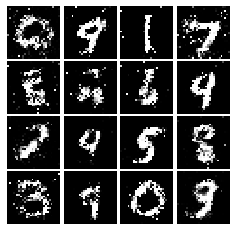

Epoch: 7, Iter: 3620, D: 1.316, G:0.8122


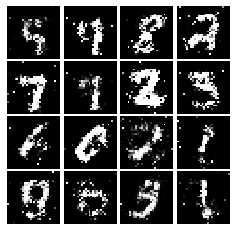

Epoch: 7, Iter: 3640, D: 1.273, G:0.7714


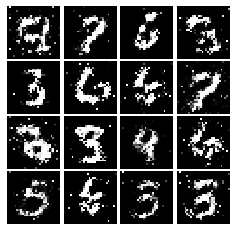

Epoch: 7, Iter: 3660, D: 1.412, G:0.7616


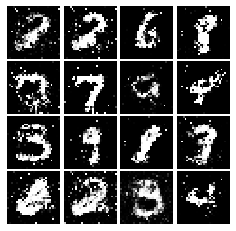

Epoch: 7, Iter: 3680, D: 1.204, G:0.8248


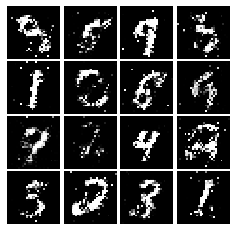

Epoch: 7, Iter: 3700, D: 1.327, G:0.7917


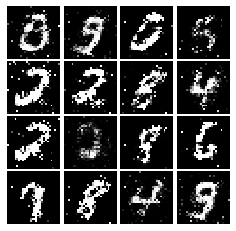

Epoch: 7, Iter: 3720, D: 1.316, G:0.8288


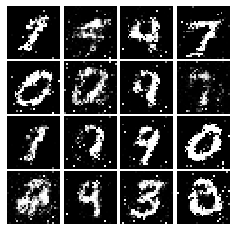

Epoch: 7, Iter: 3740, D: 1.417, G:0.8052


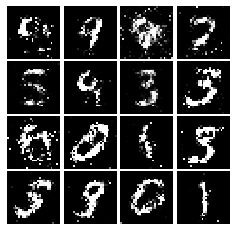

Epoch: 8, Iter: 3760, D: 1.348, G:0.8035


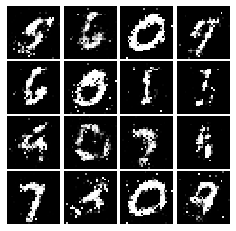

Epoch: 8, Iter: 3780, D: 1.315, G:0.8882


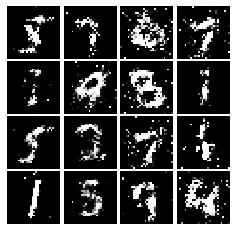

Epoch: 8, Iter: 3800, D: 1.268, G:0.8326


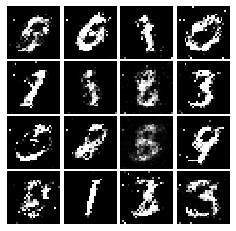

Epoch: 8, Iter: 3820, D: 1.32, G:0.7554


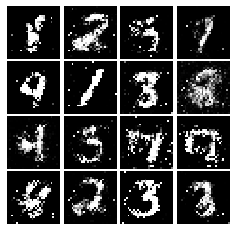

Epoch: 8, Iter: 3840, D: 1.36, G:0.8131


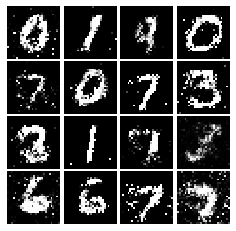

Epoch: 8, Iter: 3860, D: 1.328, G:0.7184


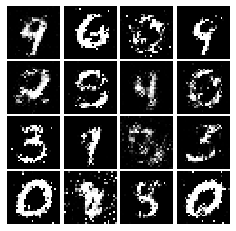

Epoch: 8, Iter: 3880, D: 1.339, G:0.6527


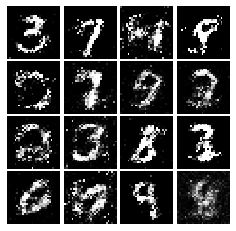

Epoch: 8, Iter: 3900, D: 1.385, G:0.7464


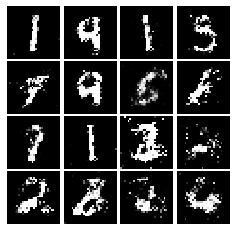

Epoch: 8, Iter: 3920, D: 1.317, G:0.777


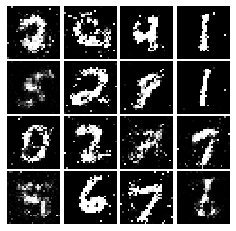

Epoch: 8, Iter: 3940, D: 1.257, G:0.8361


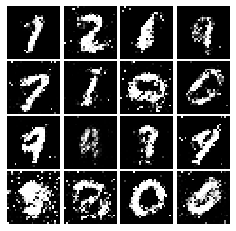

Epoch: 8, Iter: 3960, D: 1.333, G:0.815


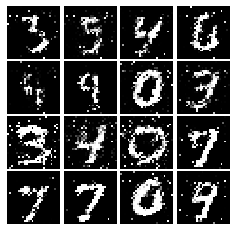

Epoch: 8, Iter: 3980, D: 1.338, G:0.8585


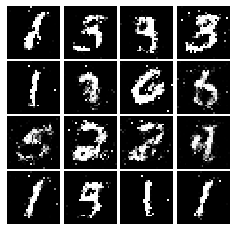

Epoch: 8, Iter: 4000, D: 1.307, G:0.7954


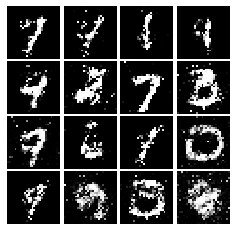

Epoch: 8, Iter: 4020, D: 1.29, G:0.8281


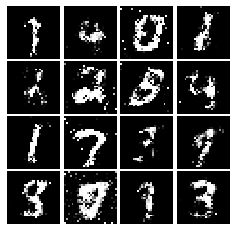

Epoch: 8, Iter: 4040, D: 1.345, G:0.7668


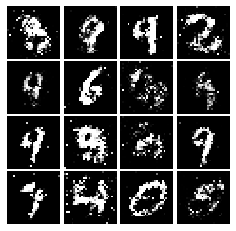

Epoch: 8, Iter: 4060, D: 1.32, G:0.8205


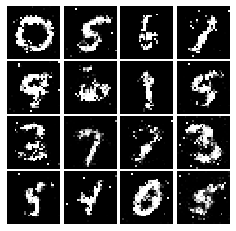

Epoch: 8, Iter: 4080, D: 1.399, G:0.8758


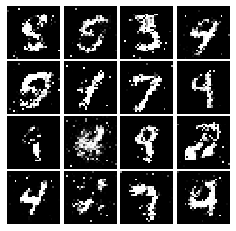

Epoch: 8, Iter: 4100, D: 1.37, G:0.7884


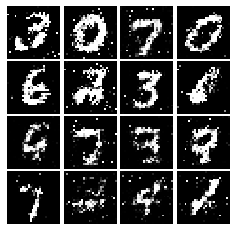

Epoch: 8, Iter: 4120, D: 1.352, G:0.749


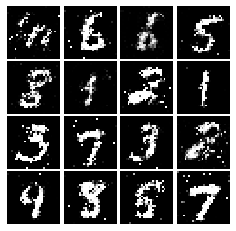

Epoch: 8, Iter: 4140, D: 1.28, G:0.815


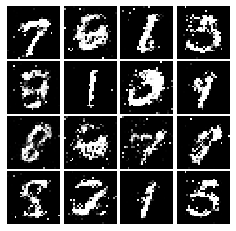

Epoch: 8, Iter: 4160, D: 1.317, G:0.859


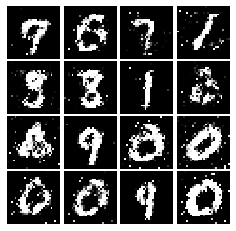

Epoch: 8, Iter: 4180, D: 1.334, G:0.8287


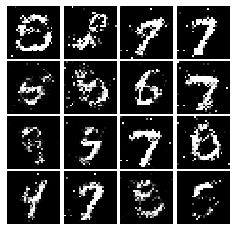

Epoch: 8, Iter: 4200, D: 1.314, G:0.8861


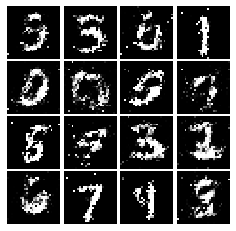

Epoch: 8, Iter: 4220, D: 1.265, G:1.124


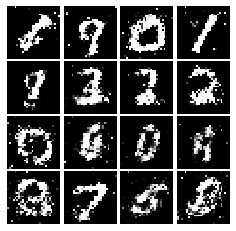

Epoch: 9, Iter: 4240, D: 1.402, G:1.36


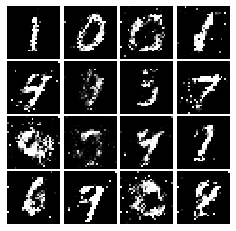

Epoch: 9, Iter: 4260, D: 1.382, G:0.728


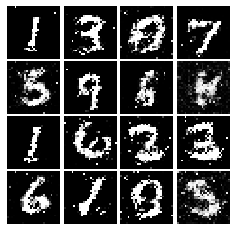

Epoch: 9, Iter: 4280, D: 1.443, G:0.8541


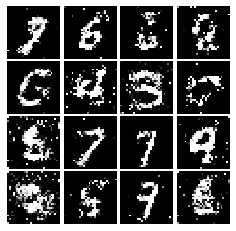

Epoch: 9, Iter: 4300, D: 1.38, G:0.7501


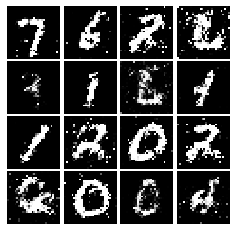

Epoch: 9, Iter: 4320, D: 1.325, G:0.7548


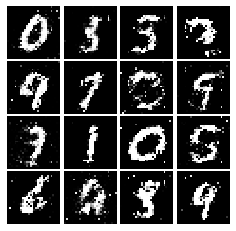

Epoch: 9, Iter: 4340, D: 1.398, G:0.8121


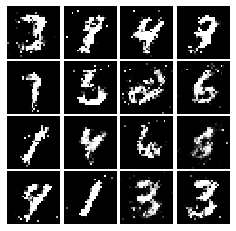

Epoch: 9, Iter: 4360, D: 1.421, G:0.9255


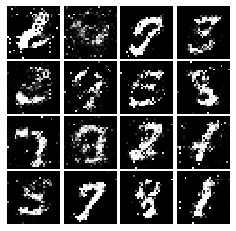

Epoch: 9, Iter: 4380, D: 1.335, G:0.7647


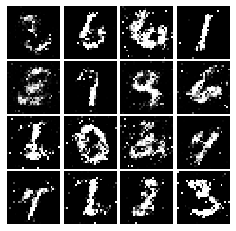

Epoch: 9, Iter: 4400, D: 1.259, G:0.9179


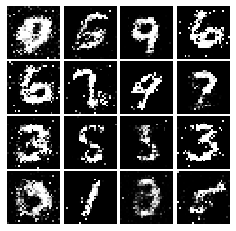

Epoch: 9, Iter: 4420, D: 1.278, G:0.796


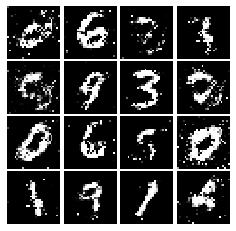

Epoch: 9, Iter: 4440, D: 1.336, G:0.8549


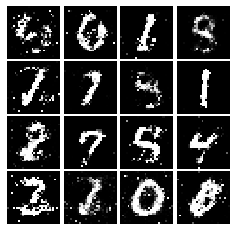

Epoch: 9, Iter: 4460, D: 1.317, G:0.8213


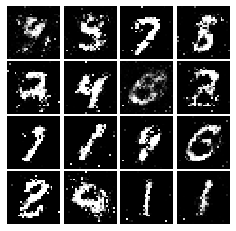

Epoch: 9, Iter: 4480, D: 1.32, G:0.7588


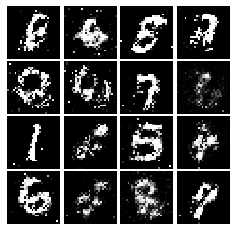

Epoch: 9, Iter: 4500, D: 1.356, G:0.7372


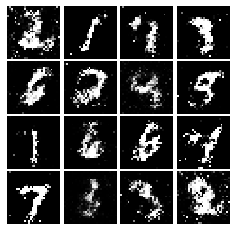

Epoch: 9, Iter: 4520, D: 1.329, G:0.799


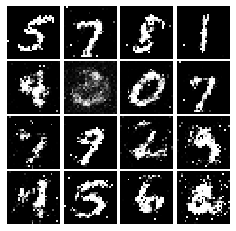

Epoch: 9, Iter: 4540, D: 1.325, G:0.7907


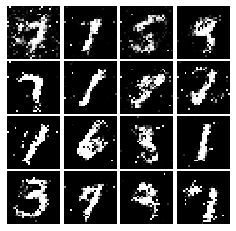

Epoch: 9, Iter: 4560, D: 1.336, G:0.8525


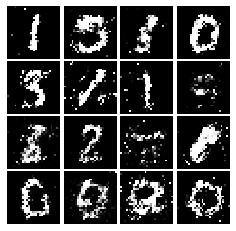

Epoch: 9, Iter: 4580, D: 1.32, G:0.8353


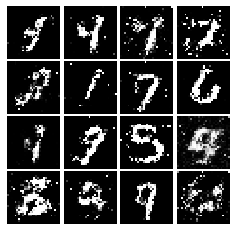

Epoch: 9, Iter: 4600, D: 1.353, G:0.7954


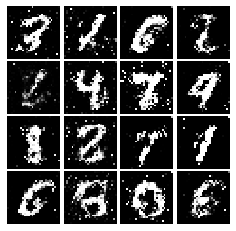

Epoch: 9, Iter: 4620, D: 1.289, G:0.8794


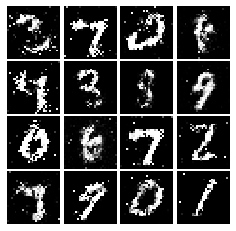

Epoch: 9, Iter: 4640, D: 1.323, G:0.8428


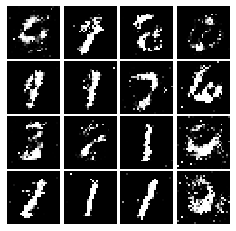

Epoch: 9, Iter: 4660, D: 1.303, G:0.8435


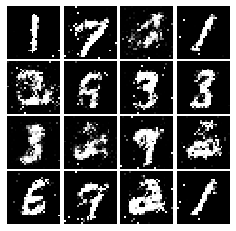

Epoch: 9, Iter: 4680, D: 1.323, G:0.8178


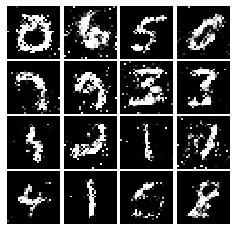

Final images


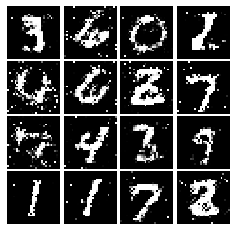

In [19]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [0]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    rloss =  tf.reduce_mean(tf.square(scores_real-1))
    floss =  tf.reduce_mean(tf.square(scores_fake))
    loss = (floss+rloss)/2.

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = tf.reduce_mean(tf.square(scores_fake-1))
    loss /=2.

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [21]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 1.348, G:0.318


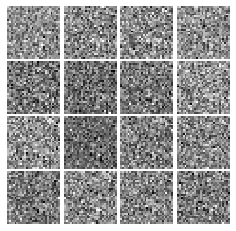

Epoch: 0, Iter: 20, D: 0.03567, G:1.373


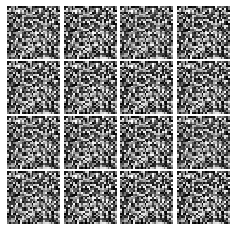

Epoch: 0, Iter: 40, D: 0.02557, G:0.947


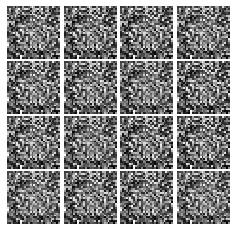

Epoch: 0, Iter: 60, D: 0.07969, G:0.8354


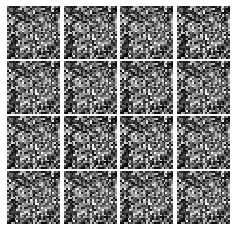

Epoch: 0, Iter: 80, D: 0.0255, G:0.7914


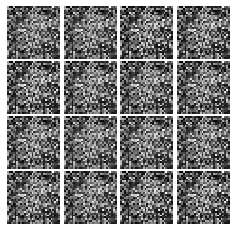

Epoch: 0, Iter: 100, D: 0.03614, G:0.772


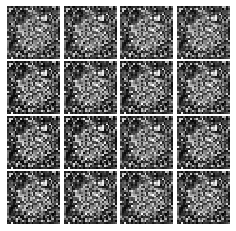

Epoch: 0, Iter: 120, D: 0.05627, G:0.6718


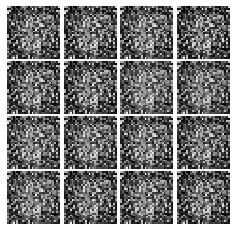

Epoch: 0, Iter: 140, D: 0.1151, G:0.5522


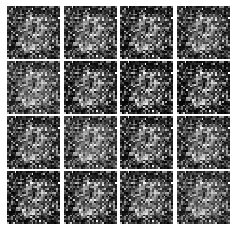

Epoch: 0, Iter: 160, D: 0.2152, G:0.3862


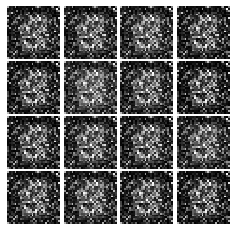

Epoch: 0, Iter: 180, D: 0.08004, G:0.3498


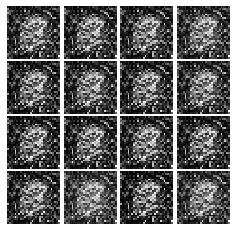

Epoch: 0, Iter: 200, D: 0.1071, G:0.6366


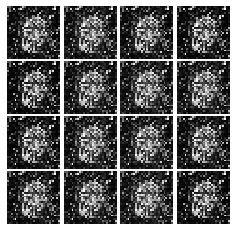

Epoch: 0, Iter: 220, D: 0.2862, G:0.1101


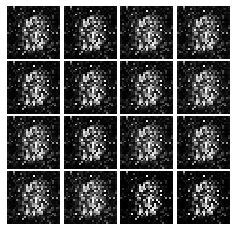

Epoch: 0, Iter: 240, D: 0.1848, G:0.5933


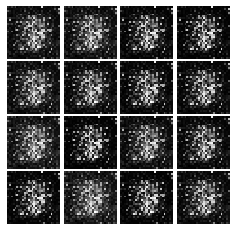

Epoch: 0, Iter: 260, D: 0.1141, G:0.4296


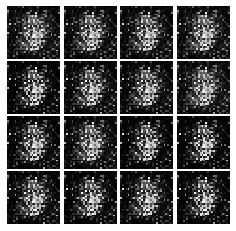

Epoch: 0, Iter: 280, D: 0.1104, G:0.4698


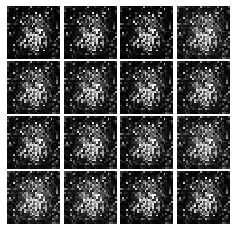

Epoch: 0, Iter: 300, D: 0.1048, G:0.3883


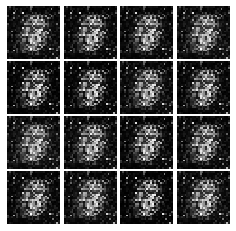

Epoch: 0, Iter: 320, D: 0.1414, G:0.689


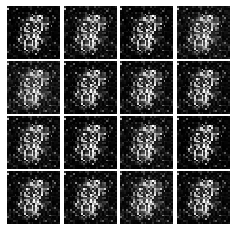

Epoch: 0, Iter: 340, D: 0.07205, G:0.5791


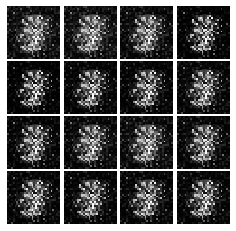

Epoch: 0, Iter: 360, D: 0.07915, G:0.5203


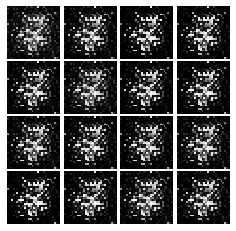

Epoch: 0, Iter: 380, D: 0.04741, G:0.4928


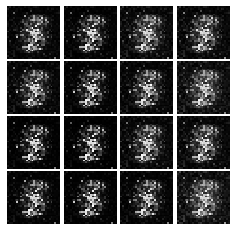

Epoch: 0, Iter: 400, D: 0.1551, G:0.8095


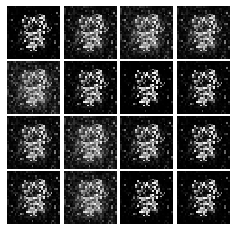

Epoch: 0, Iter: 420, D: 0.1353, G:0.4354


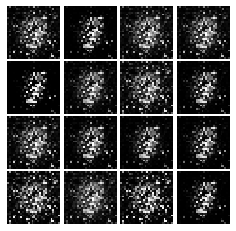

Epoch: 0, Iter: 440, D: 0.1566, G:0.4352


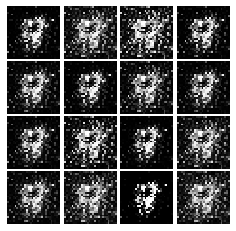

Epoch: 0, Iter: 460, D: 0.1302, G:0.3499


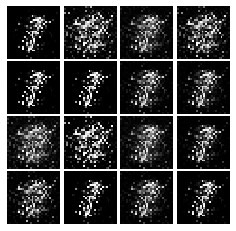

Epoch: 1, Iter: 480, D: 0.1643, G:0.3032


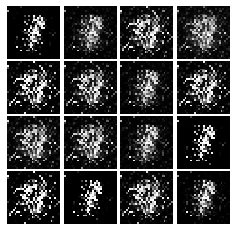

Epoch: 1, Iter: 500, D: 0.3348, G:1.038


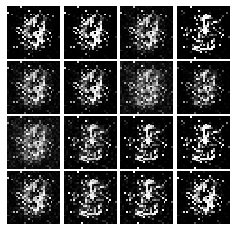

Epoch: 1, Iter: 520, D: 0.1731, G:0.7694


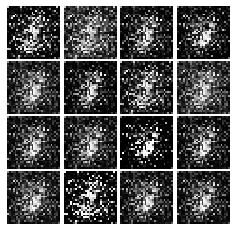

Epoch: 1, Iter: 540, D: 0.1029, G:0.3956


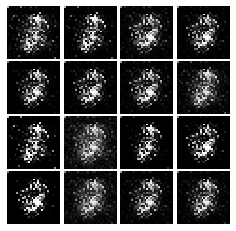

Epoch: 1, Iter: 560, D: 0.1725, G:0.3187


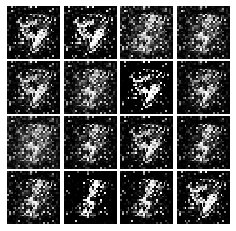

Epoch: 1, Iter: 580, D: 0.1615, G:0.5292


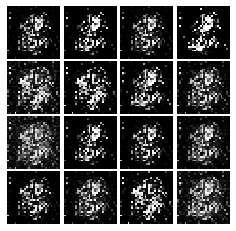

Epoch: 1, Iter: 600, D: 0.1769, G:0.2229


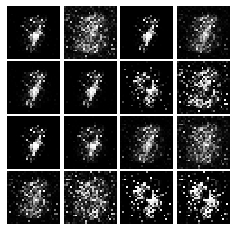

Epoch: 1, Iter: 620, D: 0.1589, G:0.3303


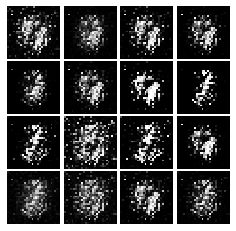

Epoch: 1, Iter: 640, D: 0.2, G:0.3138


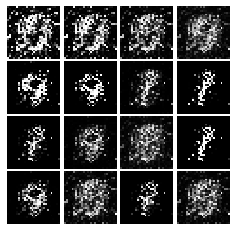

Epoch: 1, Iter: 660, D: 0.189, G:0.2574


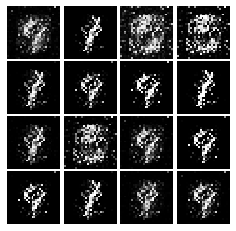

Epoch: 1, Iter: 680, D: 0.1573, G:0.2132


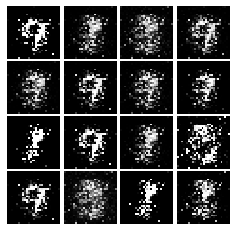

Epoch: 1, Iter: 700, D: 0.1534, G:0.3787


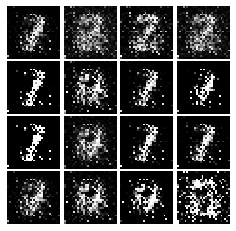

Epoch: 1, Iter: 720, D: 0.0845, G:0.6363


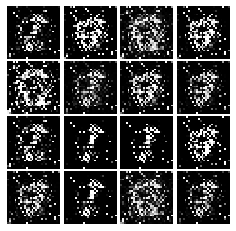

Epoch: 1, Iter: 740, D: 0.127, G:0.484


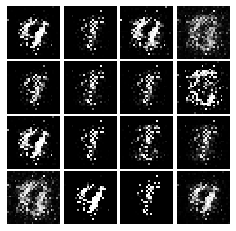

Epoch: 1, Iter: 760, D: 0.1082, G:0.3792


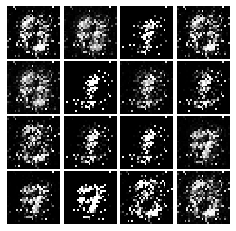

Epoch: 1, Iter: 780, D: 0.1152, G:0.4503


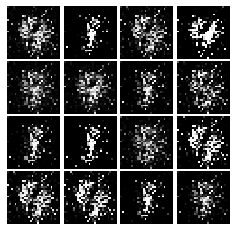

Epoch: 1, Iter: 800, D: 0.095, G:0.4569


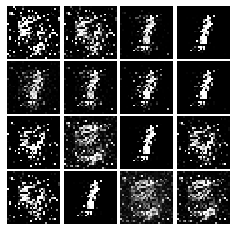

Epoch: 1, Iter: 820, D: 0.03983, G:0.3817


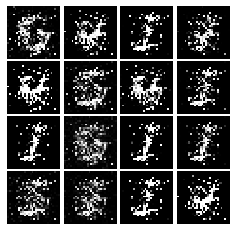

Epoch: 1, Iter: 840, D: 0.2281, G:0.345


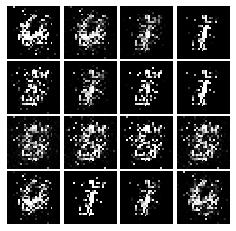

Epoch: 1, Iter: 860, D: 0.09537, G:0.3501


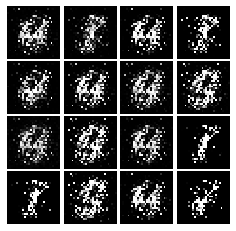

Epoch: 1, Iter: 880, D: 0.1418, G:0.357


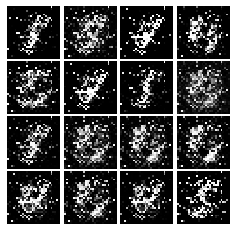

Epoch: 1, Iter: 900, D: 0.1154, G:0.3427


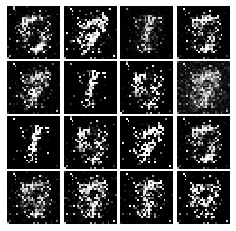

Epoch: 1, Iter: 920, D: 0.116, G:0.4716


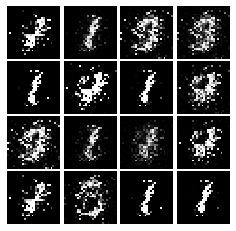

Epoch: 2, Iter: 940, D: 0.1492, G:0.3954


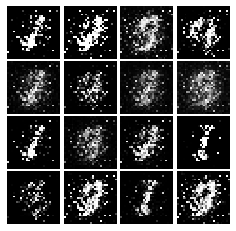

Epoch: 2, Iter: 960, D: 0.1355, G:0.4818


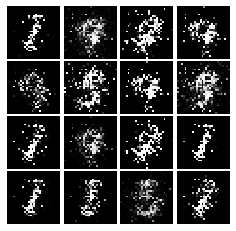

Epoch: 2, Iter: 980, D: 0.1369, G:0.408


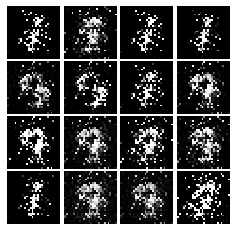

Epoch: 2, Iter: 1000, D: 0.2027, G:0.2096


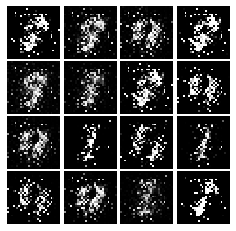

Epoch: 2, Iter: 1020, D: 0.1766, G:0.09718


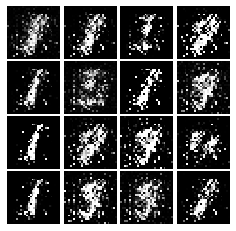

Epoch: 2, Iter: 1040, D: 0.1176, G:0.6345


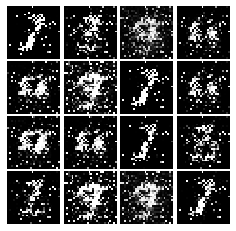

Epoch: 2, Iter: 1060, D: 0.06754, G:0.5723


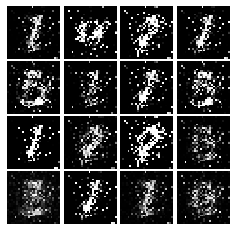

Epoch: 2, Iter: 1080, D: 0.1268, G:0.3385


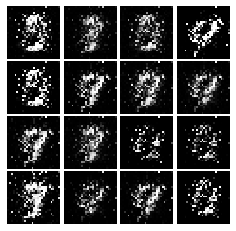

Epoch: 2, Iter: 1100, D: 0.1253, G:0.3668


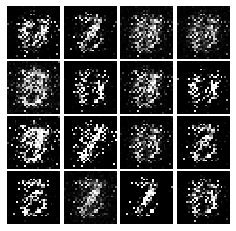

Epoch: 2, Iter: 1120, D: 0.1192, G:0.3349


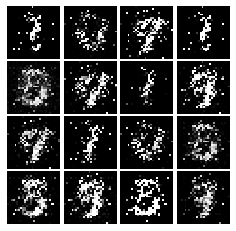

Epoch: 2, Iter: 1140, D: 0.1694, G:0.3261


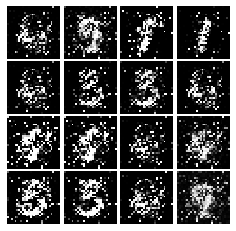

Epoch: 2, Iter: 1160, D: 0.1603, G:0.239


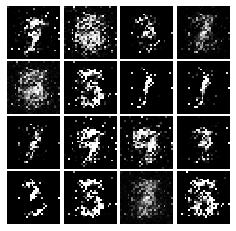

Epoch: 2, Iter: 1180, D: 0.167, G:0.2944


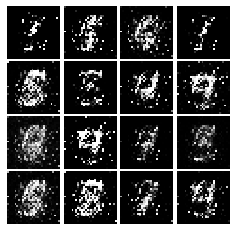

Epoch: 2, Iter: 1200, D: 0.1653, G:0.3105


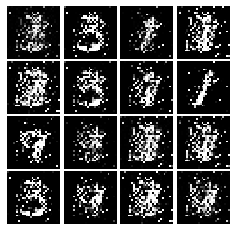

Epoch: 2, Iter: 1220, D: 0.1451, G:0.5567


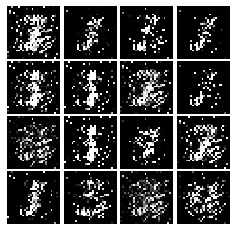

Epoch: 2, Iter: 1240, D: 0.1283, G:0.3512


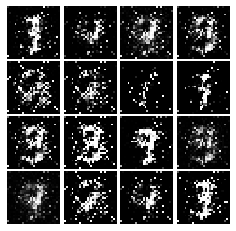

Epoch: 2, Iter: 1260, D: 0.1574, G:0.2889


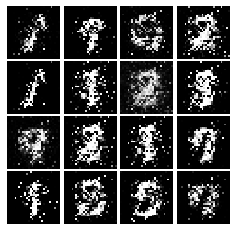

Epoch: 2, Iter: 1280, D: 0.1641, G:0.2759


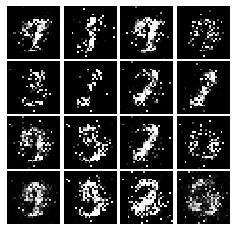

Epoch: 2, Iter: 1300, D: 0.123, G:0.3681


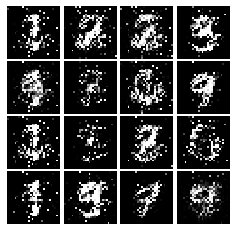

Epoch: 2, Iter: 1320, D: 0.1357, G:1.019


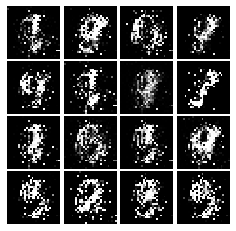

Epoch: 2, Iter: 1340, D: 0.1502, G:0.2684


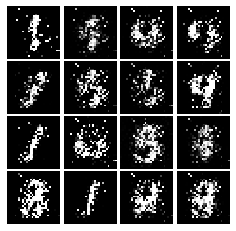

Epoch: 2, Iter: 1360, D: 0.1246, G:0.3282


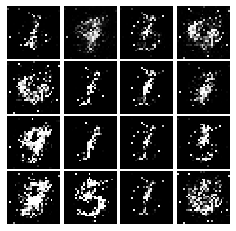

Epoch: 2, Iter: 1380, D: 0.1484, G:0.2702


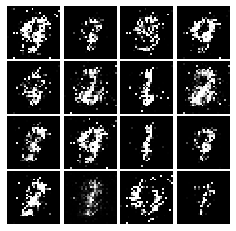

Epoch: 2, Iter: 1400, D: 0.1955, G:0.1414


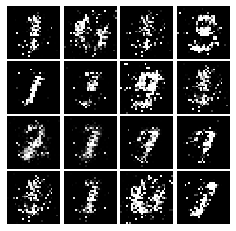

Epoch: 3, Iter: 1420, D: 0.1883, G:0.2952


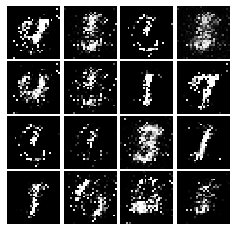

Epoch: 3, Iter: 1440, D: 0.1184, G:0.3979


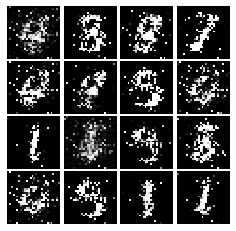

Epoch: 3, Iter: 1460, D: 0.156, G:0.4084


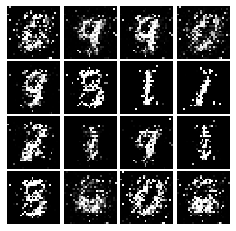

Epoch: 3, Iter: 1480, D: 0.1713, G:0.331


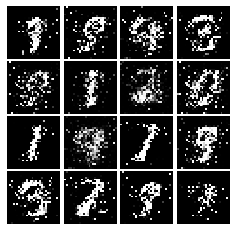

Epoch: 3, Iter: 1500, D: 0.1395, G:0.4291


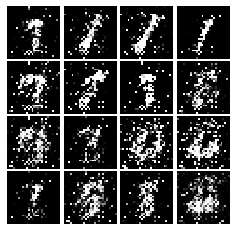

Epoch: 3, Iter: 1520, D: 0.1908, G:0.2109


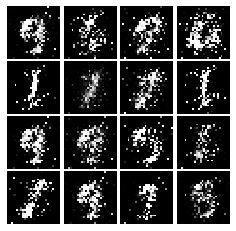

Epoch: 3, Iter: 1540, D: 0.1763, G:0.3034


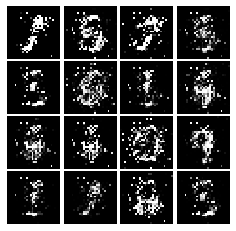

Epoch: 3, Iter: 1560, D: 0.1689, G:0.1801


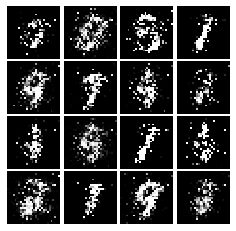

Epoch: 3, Iter: 1580, D: 0.1804, G:0.313


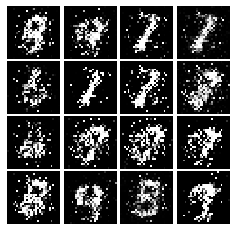

Epoch: 3, Iter: 1600, D: 0.1657, G:0.3244


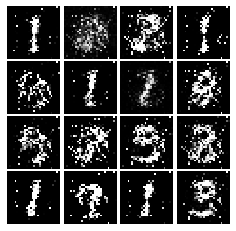

Epoch: 3, Iter: 1620, D: 0.1472, G:0.281


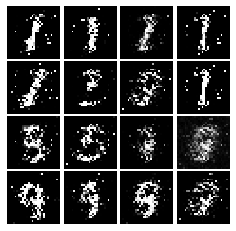

Epoch: 3, Iter: 1640, D: 0.1106, G:0.3115


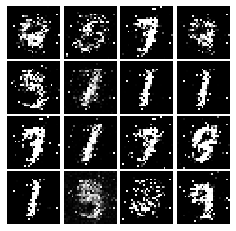

Epoch: 3, Iter: 1660, D: 0.1403, G:0.3122


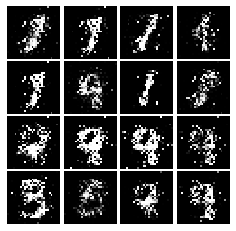

Epoch: 3, Iter: 1680, D: 0.1654, G:0.3672


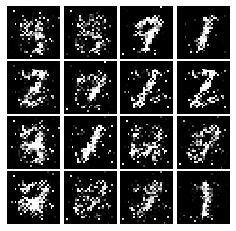

Epoch: 3, Iter: 1700, D: 0.2112, G:0.2249


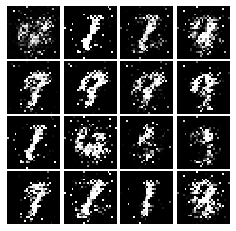

Epoch: 3, Iter: 1720, D: 0.165, G:0.2566


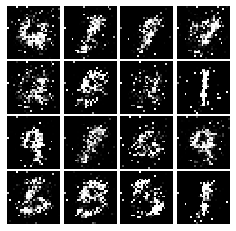

Epoch: 3, Iter: 1740, D: 0.1935, G:0.2686


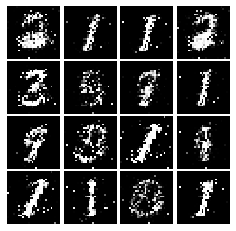

Epoch: 3, Iter: 1760, D: 0.1765, G:0.2186


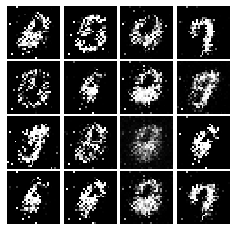

Epoch: 3, Iter: 1780, D: 0.1692, G:0.2562


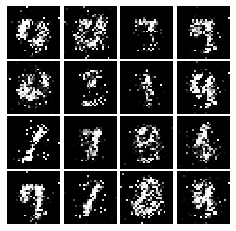

Epoch: 3, Iter: 1800, D: 0.2646, G:0.1586


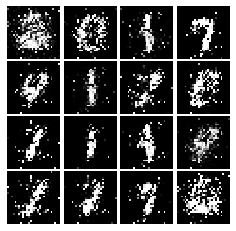

Epoch: 3, Iter: 1820, D: 0.1831, G:0.2597


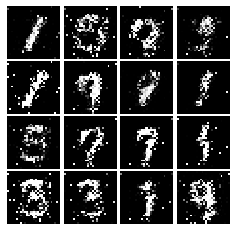

Epoch: 3, Iter: 1840, D: 0.2285, G:0.3461


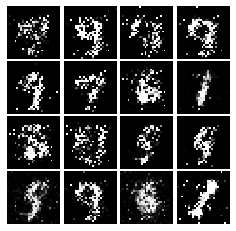

Epoch: 3, Iter: 1860, D: 0.2054, G:0.2128


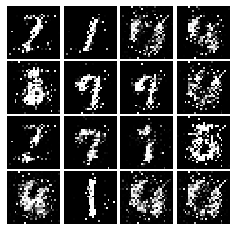

Epoch: 4, Iter: 1880, D: 0.1727, G:0.2355


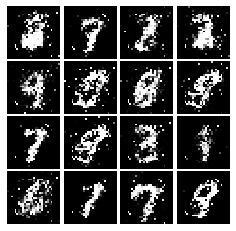

Epoch: 4, Iter: 1900, D: 0.1947, G:0.2029


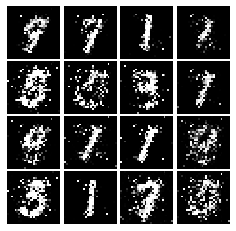

Epoch: 4, Iter: 1920, D: 0.187, G:0.3167


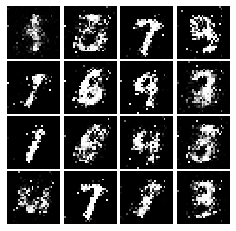

Epoch: 4, Iter: 1940, D: 0.1957, G:0.1922


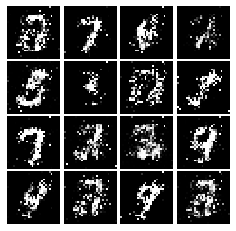

Epoch: 4, Iter: 1960, D: 0.1929, G:0.2227


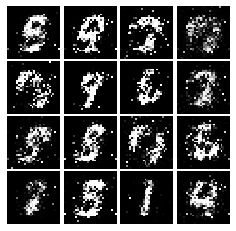

Epoch: 4, Iter: 1980, D: 0.1501, G:0.1278


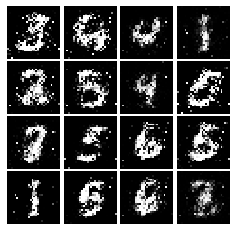

Epoch: 4, Iter: 2000, D: 0.2035, G:0.2058


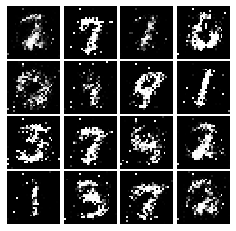

Epoch: 4, Iter: 2020, D: 0.1974, G:0.2108


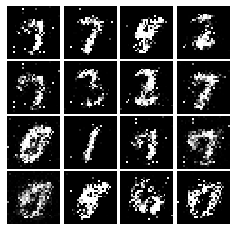

Epoch: 4, Iter: 2040, D: 0.1874, G:0.2309


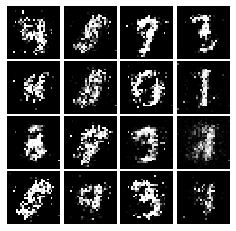

Epoch: 4, Iter: 2060, D: 0.2031, G:0.2092


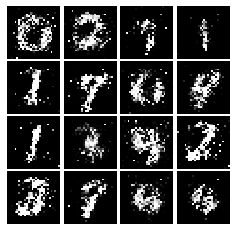

Epoch: 4, Iter: 2080, D: 0.2087, G:0.2401


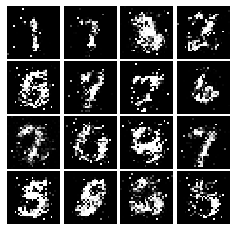

Epoch: 4, Iter: 2100, D: 0.2016, G:0.2262


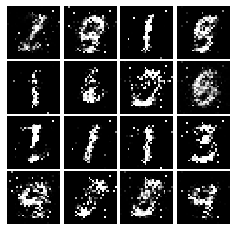

Epoch: 4, Iter: 2120, D: 0.2135, G:0.2448


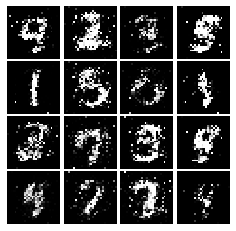

Epoch: 4, Iter: 2140, D: 0.2076, G:0.2307


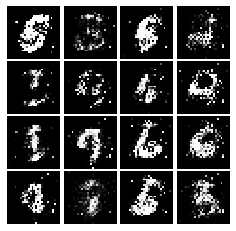

Epoch: 4, Iter: 2160, D: 0.2092, G:0.2057


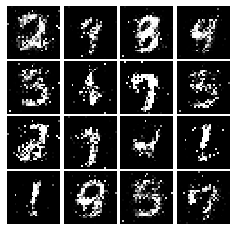

Epoch: 4, Iter: 2180, D: 0.1999, G:0.2185


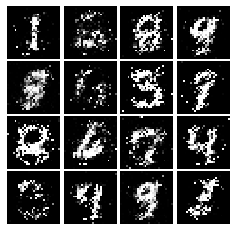

Epoch: 4, Iter: 2200, D: 0.1699, G:0.2432


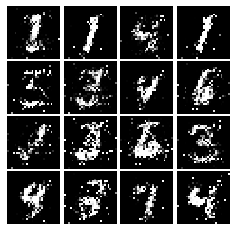

Epoch: 4, Iter: 2220, D: 0.206, G:0.2142


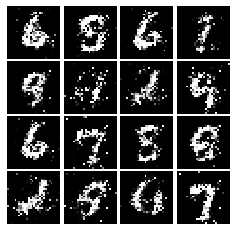

Epoch: 4, Iter: 2240, D: 0.2037, G:0.1899


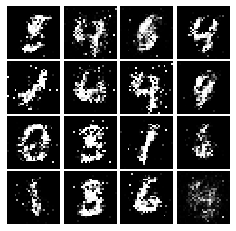

Epoch: 4, Iter: 2260, D: 0.1826, G:0.2529


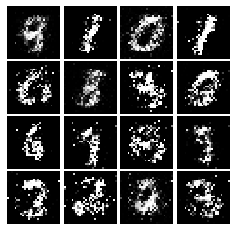

Epoch: 4, Iter: 2280, D: 0.2147, G:0.2257


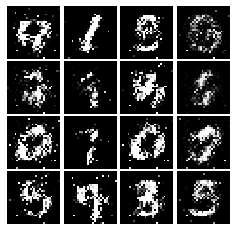

Epoch: 4, Iter: 2300, D: 0.2382, G:0.1843


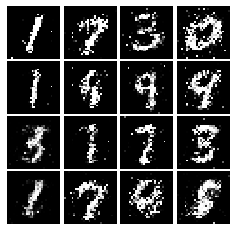

Epoch: 4, Iter: 2320, D: 0.1867, G:0.3119


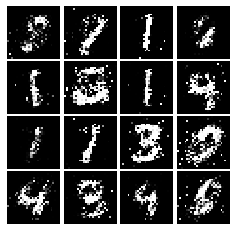

Epoch: 4, Iter: 2340, D: 0.1754, G:0.4297


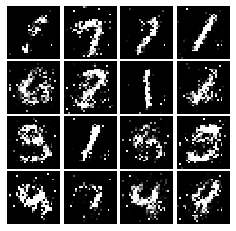

Epoch: 5, Iter: 2360, D: 0.2225, G:0.2888


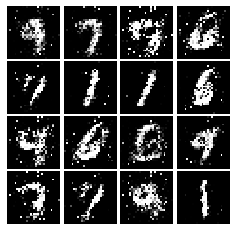

Epoch: 5, Iter: 2380, D: 0.2123, G:0.2026


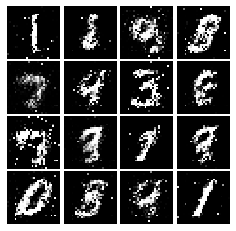

Epoch: 5, Iter: 2400, D: 0.2102, G:0.1662


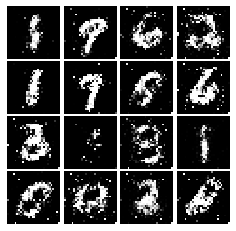

Epoch: 5, Iter: 2420, D: 0.2273, G:0.2035


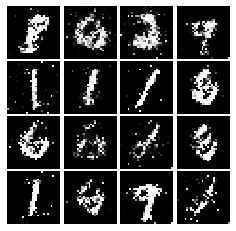

Epoch: 5, Iter: 2440, D: 0.2196, G:0.1989


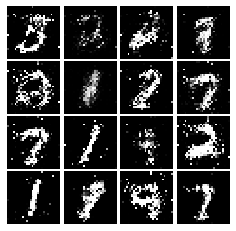

Epoch: 5, Iter: 2460, D: 0.1818, G:0.229


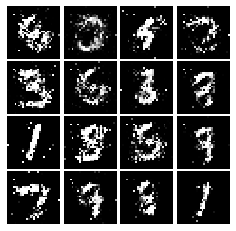

Epoch: 5, Iter: 2480, D: 0.1971, G:0.2133


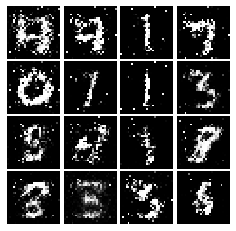

Epoch: 5, Iter: 2500, D: 0.2031, G:0.1992


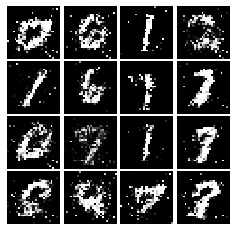

Epoch: 5, Iter: 2520, D: 0.2771, G:0.2157


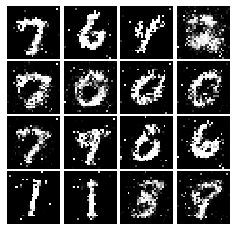

Epoch: 5, Iter: 2540, D: 0.2031, G:0.1897


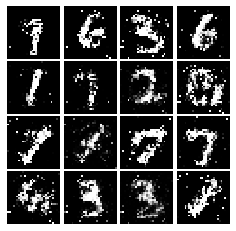

Epoch: 5, Iter: 2560, D: 0.2437, G:0.1928


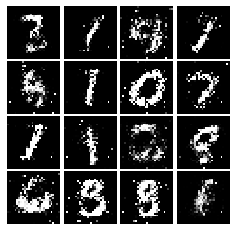

Epoch: 5, Iter: 2580, D: 0.2132, G:0.168


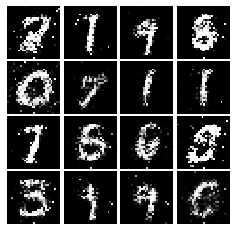

Epoch: 5, Iter: 2600, D: 0.2722, G:0.1269


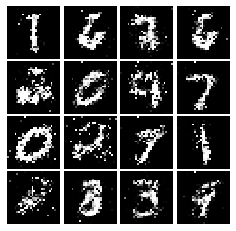

Epoch: 5, Iter: 2620, D: 0.2167, G:0.1851


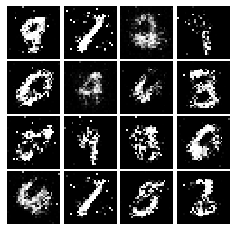

Epoch: 5, Iter: 2640, D: 0.2479, G:0.1986


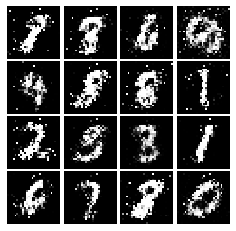

Epoch: 5, Iter: 2660, D: 0.2118, G:0.2436


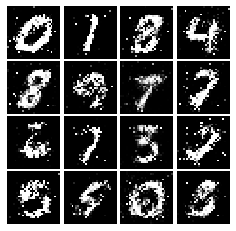

Epoch: 5, Iter: 2680, D: 0.2436, G:0.1836


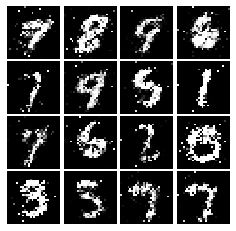

Epoch: 5, Iter: 2700, D: 0.2335, G:0.168


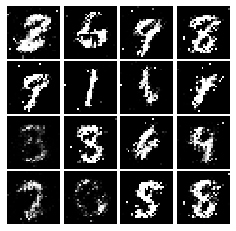

Epoch: 5, Iter: 2720, D: 0.2219, G:0.1775


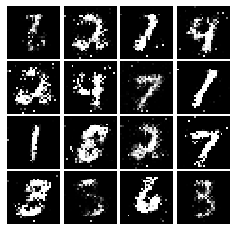

Epoch: 5, Iter: 2740, D: 0.2316, G:0.1727


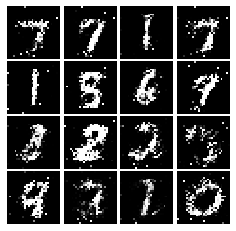

Epoch: 5, Iter: 2760, D: 0.2135, G:0.2095


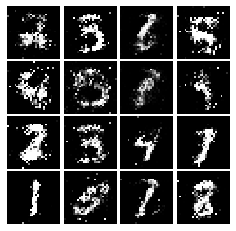

Epoch: 5, Iter: 2780, D: 0.211, G:0.1783


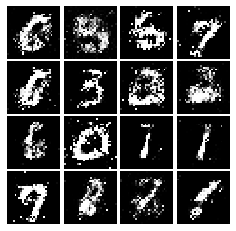

Epoch: 5, Iter: 2800, D: 0.1952, G:0.1881


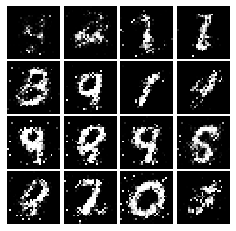

Epoch: 6, Iter: 2820, D: 0.2079, G:0.1887


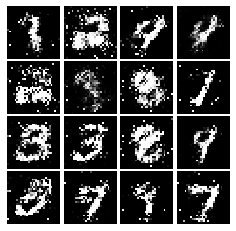

Epoch: 6, Iter: 2840, D: 0.2339, G:0.1749


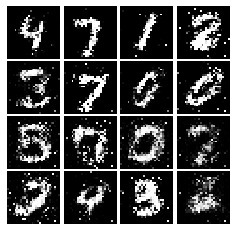

Epoch: 6, Iter: 2860, D: 0.2047, G:0.152


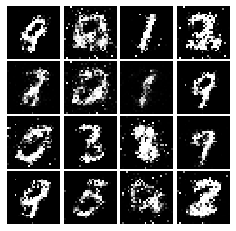

Epoch: 6, Iter: 2880, D: 0.1992, G:0.2007


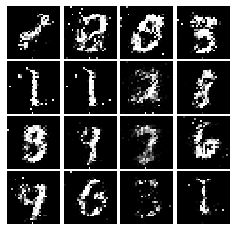

Epoch: 6, Iter: 2900, D: 0.2154, G:0.2144


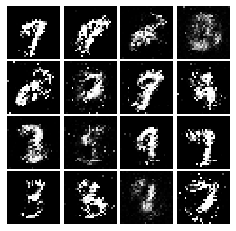

Epoch: 6, Iter: 2920, D: 0.2368, G:0.1934


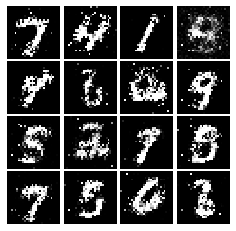

Epoch: 6, Iter: 2940, D: 0.2269, G:0.1638


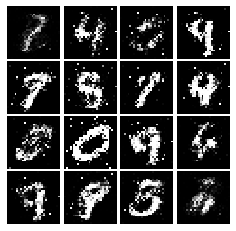

Epoch: 6, Iter: 2960, D: 0.2174, G:0.1629


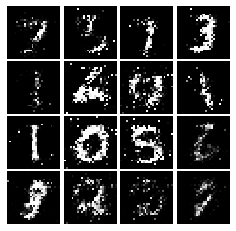

Epoch: 6, Iter: 2980, D: 0.2353, G:0.1699


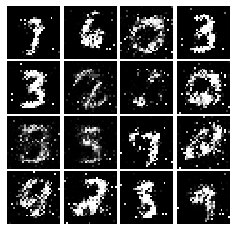

Epoch: 6, Iter: 3000, D: 0.2295, G:0.2411


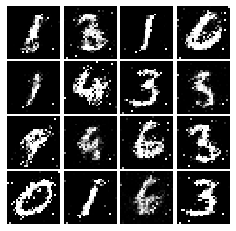

Epoch: 6, Iter: 3020, D: 0.2332, G:0.1842


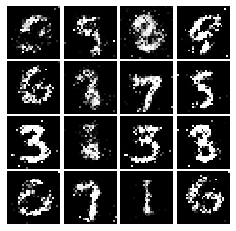

Epoch: 6, Iter: 3040, D: 0.2156, G:0.2091


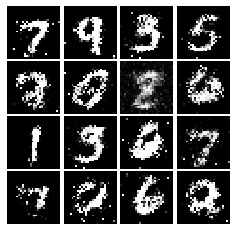

Epoch: 6, Iter: 3060, D: 0.2141, G:0.1727


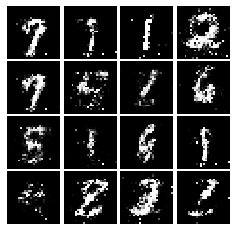

Epoch: 6, Iter: 3080, D: 0.239, G:0.1671


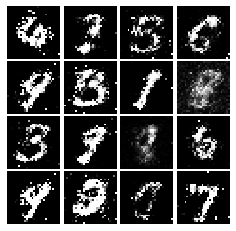

Epoch: 6, Iter: 3100, D: 0.2106, G:0.1668


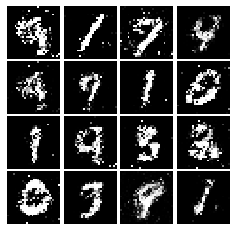

Epoch: 6, Iter: 3120, D: 0.224, G:0.1796


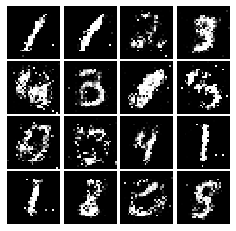

Epoch: 6, Iter: 3140, D: 0.2208, G:0.165


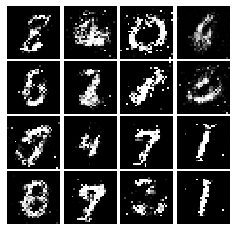

Epoch: 6, Iter: 3160, D: 0.2111, G:0.1944


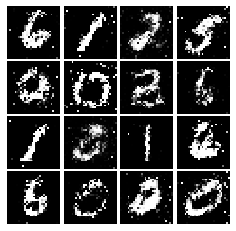

Epoch: 6, Iter: 3180, D: 0.1917, G:0.1986


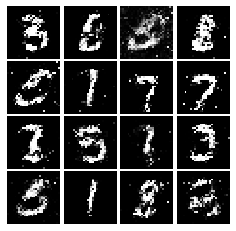

Epoch: 6, Iter: 3200, D: 0.2105, G:0.2323


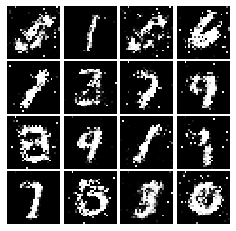

Epoch: 6, Iter: 3220, D: 0.2319, G:0.1893


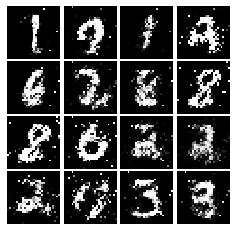

Epoch: 6, Iter: 3240, D: 0.192, G:0.2763


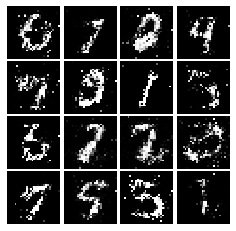

Epoch: 6, Iter: 3260, D: 0.2669, G:0.1886


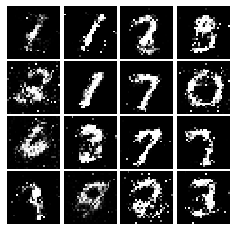

Epoch: 6, Iter: 3280, D: 0.2169, G:0.1794


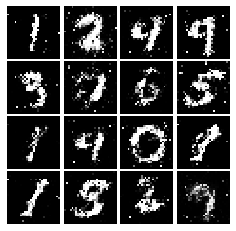

Epoch: 7, Iter: 3300, D: 0.2145, G:0.1994


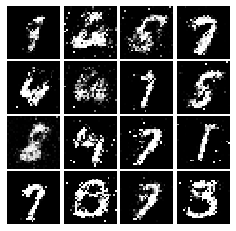

Epoch: 7, Iter: 3320, D: 0.1857, G:0.1965


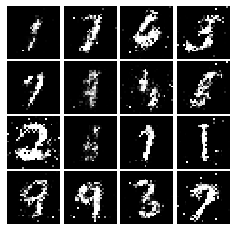

Epoch: 7, Iter: 3340, D: 0.235, G:0.2125


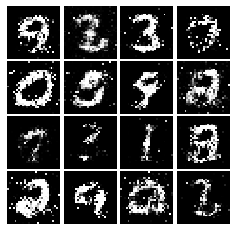

Epoch: 7, Iter: 3360, D: 0.2552, G:0.1652


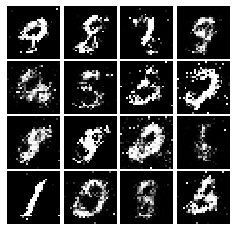

Epoch: 7, Iter: 3380, D: 0.2749, G:0.1906


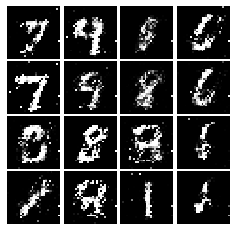

Epoch: 7, Iter: 3400, D: 0.2309, G:0.1852


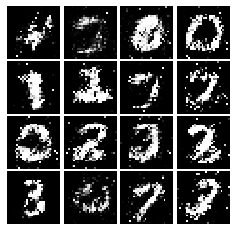

Epoch: 7, Iter: 3420, D: 0.2227, G:0.1857


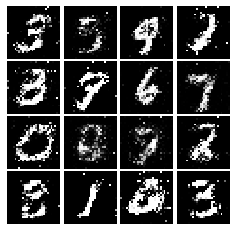

Epoch: 7, Iter: 3440, D: 0.2087, G:0.1888


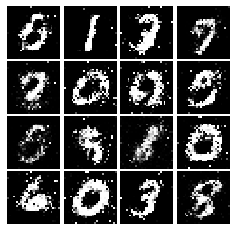

Epoch: 7, Iter: 3460, D: 0.2144, G:0.2054


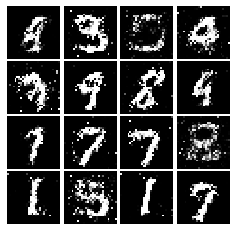

Epoch: 7, Iter: 3480, D: 0.2397, G:0.1736


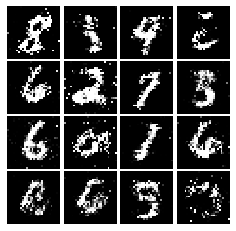

Epoch: 7, Iter: 3500, D: 0.2236, G:0.1684


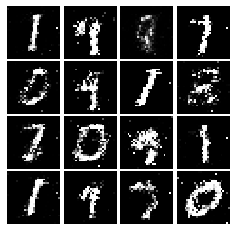

Epoch: 7, Iter: 3520, D: 0.2235, G:0.153


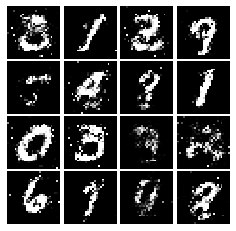

Epoch: 7, Iter: 3540, D: 0.1961, G:0.2054


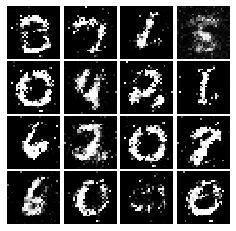

Epoch: 7, Iter: 3560, D: 0.2066, G:0.1724


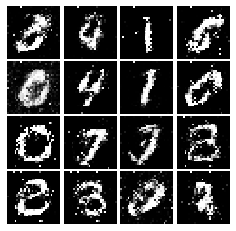

Epoch: 7, Iter: 3580, D: 0.2316, G:0.2016


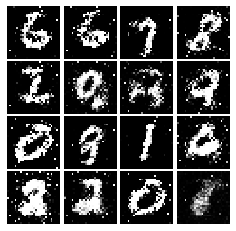

Epoch: 7, Iter: 3600, D: 0.2185, G:0.1763


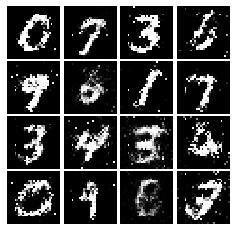

Epoch: 7, Iter: 3620, D: 0.2298, G:0.1884


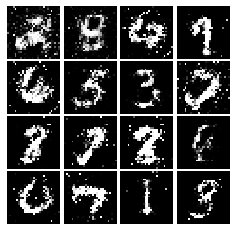

Epoch: 7, Iter: 3640, D: 0.226, G:0.1726


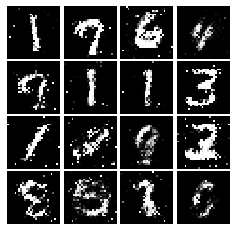

Epoch: 7, Iter: 3660, D: 0.1996, G:0.1755


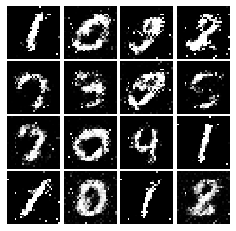

Epoch: 7, Iter: 3680, D: 0.2062, G:0.2009


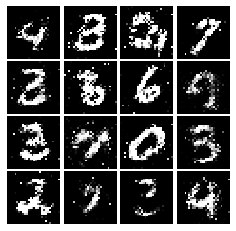

Epoch: 7, Iter: 3700, D: 0.2288, G:0.1756


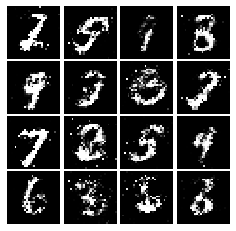

Epoch: 7, Iter: 3720, D: 0.2196, G:0.159


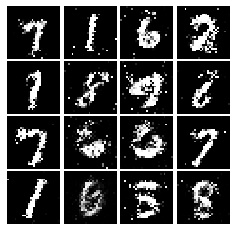

Epoch: 7, Iter: 3740, D: 0.2231, G:0.1477


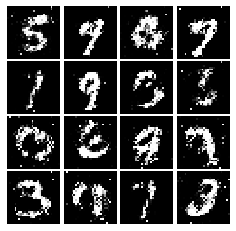

Epoch: 8, Iter: 3760, D: 0.2586, G:0.1533


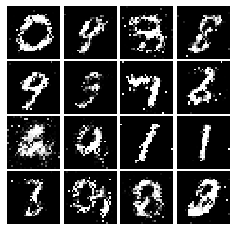

Epoch: 8, Iter: 3780, D: 0.2349, G:0.1679


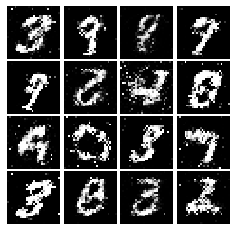

Epoch: 8, Iter: 3800, D: 0.2104, G:0.1828


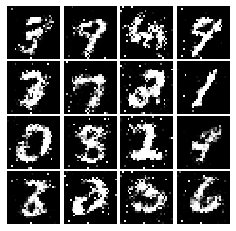

Epoch: 8, Iter: 3820, D: 0.2246, G:0.1739


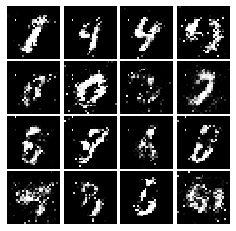

Epoch: 8, Iter: 3840, D: 0.2109, G:0.2084


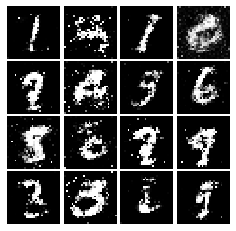

Epoch: 8, Iter: 3860, D: 0.2189, G:0.2086


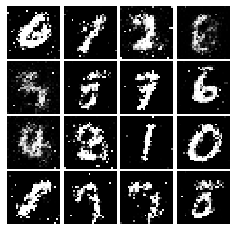

Epoch: 8, Iter: 3880, D: 0.2224, G:0.1569


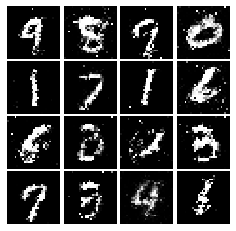

Epoch: 8, Iter: 3900, D: 0.2336, G:0.1544


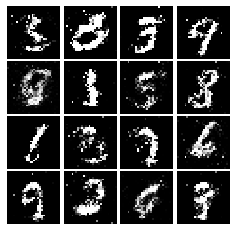

Epoch: 8, Iter: 3920, D: 0.2111, G:0.162


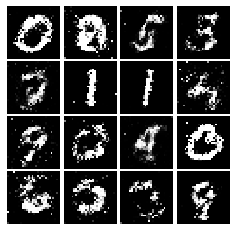

Epoch: 8, Iter: 3940, D: 0.2124, G:0.1602


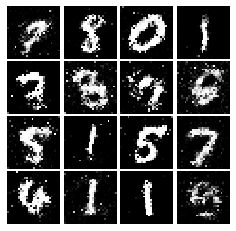

Epoch: 8, Iter: 3960, D: 0.2471, G:0.2046


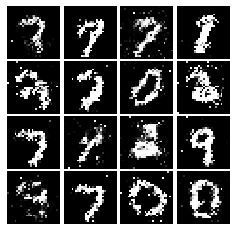

Epoch: 8, Iter: 3980, D: 0.2311, G:0.1586


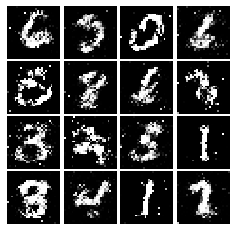

Epoch: 8, Iter: 4000, D: 0.2113, G:0.1817


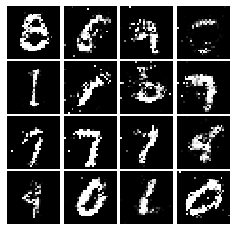

Epoch: 8, Iter: 4020, D: 0.2252, G:0.1694


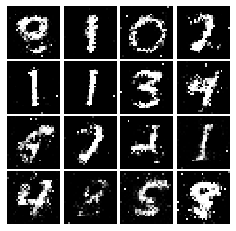

Epoch: 8, Iter: 4040, D: 0.2381, G:0.1493


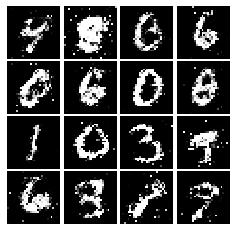

Epoch: 8, Iter: 4060, D: 0.2242, G:0.1662


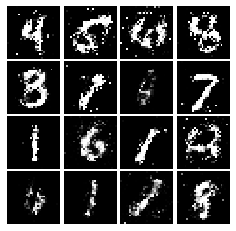

Epoch: 8, Iter: 4080, D: 0.2477, G:0.1616


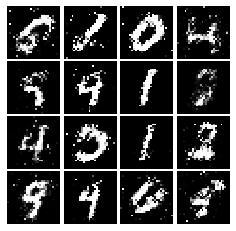

Epoch: 8, Iter: 4100, D: 0.2247, G:0.1773


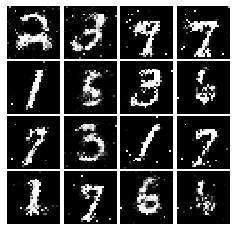

Epoch: 8, Iter: 4120, D: 0.2241, G:0.174


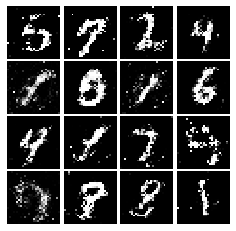

Epoch: 8, Iter: 4140, D: 0.2254, G:0.2045


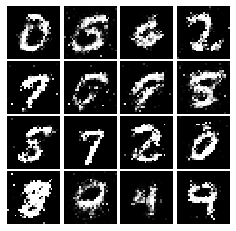

Epoch: 8, Iter: 4160, D: 0.2028, G:0.1704


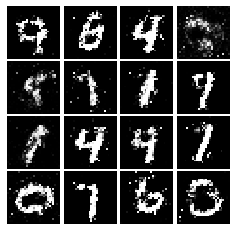

Epoch: 8, Iter: 4180, D: 0.2264, G:0.1691


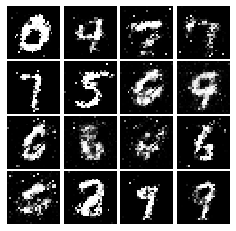

Epoch: 8, Iter: 4200, D: 0.2226, G:0.1822


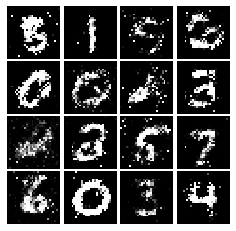

Epoch: 8, Iter: 4220, D: 0.2404, G:0.177


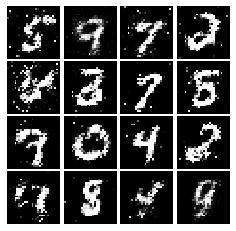

Epoch: 9, Iter: 4240, D: 0.2319, G:0.1909


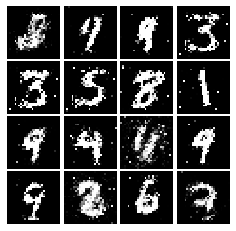

Epoch: 9, Iter: 4260, D: 0.2514, G:0.15


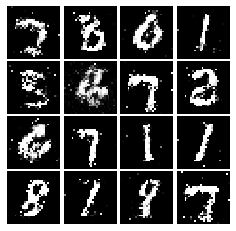

Epoch: 9, Iter: 4280, D: 0.2211, G:0.1593


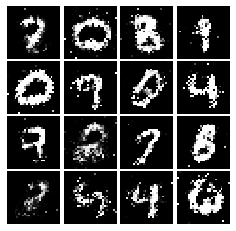

Epoch: 9, Iter: 4300, D: 0.2237, G:0.1896


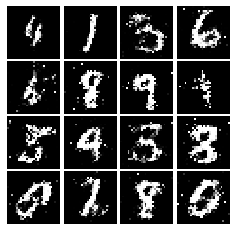

Epoch: 9, Iter: 4320, D: 0.2529, G:0.1373


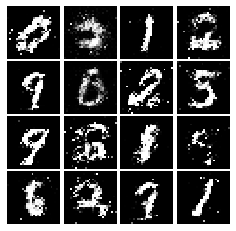

Epoch: 9, Iter: 4340, D: 0.2231, G:0.1688


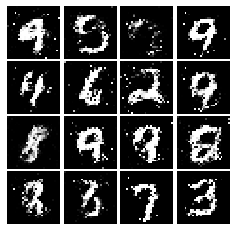

Epoch: 9, Iter: 4360, D: 0.2347, G:0.1603


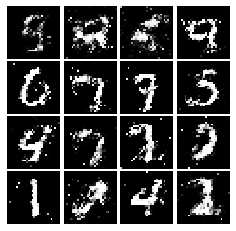

Epoch: 9, Iter: 4380, D: 0.235, G:0.1815


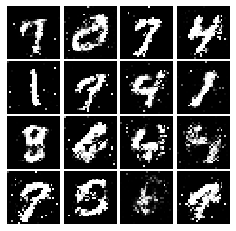

Epoch: 9, Iter: 4400, D: 0.2055, G:0.1809


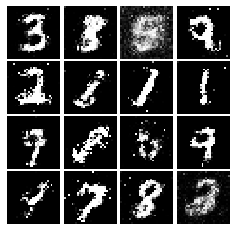

Epoch: 9, Iter: 4420, D: 0.2018, G:0.1897


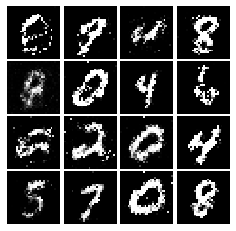

Epoch: 9, Iter: 4440, D: 0.2381, G:0.1637


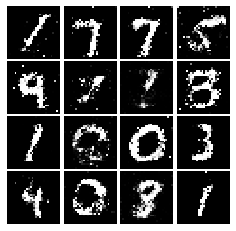

Epoch: 9, Iter: 4460, D: 0.2149, G:0.1922


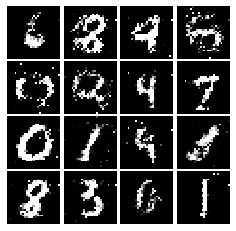

Epoch: 9, Iter: 4480, D: 0.221, G:0.1682


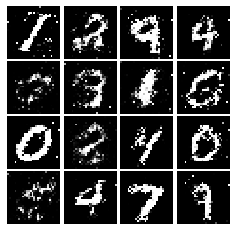

Epoch: 9, Iter: 4500, D: 0.2315, G:0.154


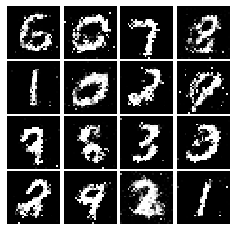

Epoch: 9, Iter: 4520, D: 0.2344, G:0.1646


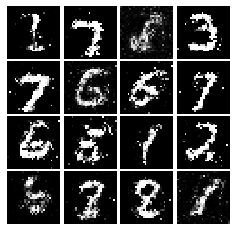

Epoch: 9, Iter: 4540, D: 0.2421, G:0.1561


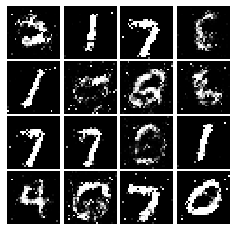

Epoch: 9, Iter: 4560, D: 0.2227, G:0.1766


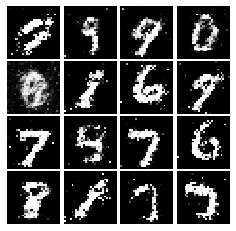

Epoch: 9, Iter: 4580, D: 0.2337, G:0.1542


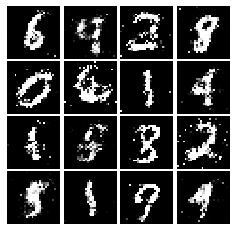

Epoch: 9, Iter: 4600, D: 0.2391, G:0.1719


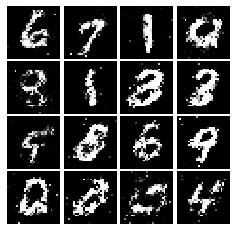

Epoch: 9, Iter: 4620, D: 0.2409, G:0.1753


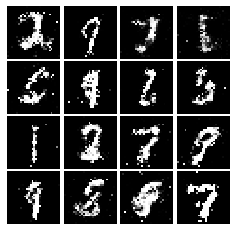

Epoch: 9, Iter: 4640, D: 0.2229, G:0.1903


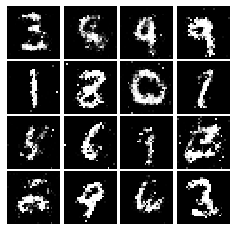

Epoch: 9, Iter: 4660, D: 0.2429, G:0.1636


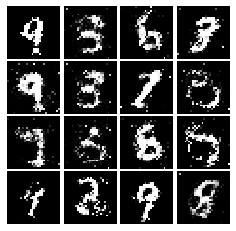

Epoch: 9, Iter: 4680, D: 0.23, G:0.1907


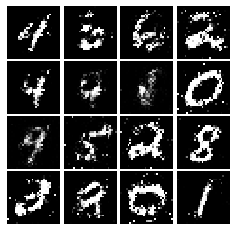

Final images


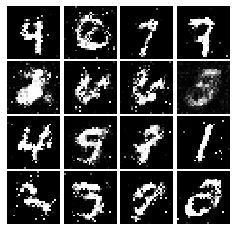

In [22]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [23]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Reshape((28, 28, 1), input_shape=(784,)),
        tf.keras.layers.Conv2D(32, 5, strides=1, padding='valid'), 
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPool2D(2),
        tf.keras.layers.Conv2D(64, 5, strides=1, padding='valid'),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPool2D(2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [32]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    tf.keras.layers.Dense(1024, input_shape=(noise_dim,), activation='relu'),
    tf.keras.layers.BatchNormalization(axis=-1),
    tf.keras.layers.Dense(7*7*128, activation='relu'),
    tf.keras.layers.BatchNormalization(axis=-1),
    tf.keras.layers.Reshape((7, 7, 128)), 
    tf.keras.layers.Conv2DTranspose(64, 4, strides=2, padding='same', activation='relu'), 
    tf.keras.layers.BatchNormalization(axis=-1),
    tf.keras.layers.Conv2DTranspose(1, 4, strides=2, padding='same', activation='tanh'),

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.364, G:0.668


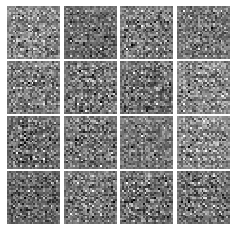

Epoch: 0, Iter: 20, D: 0.4461, G:2.323


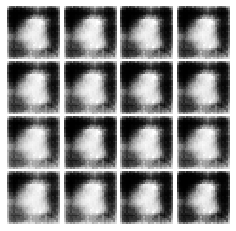

Epoch: 0, Iter: 40, D: 0.464, G:1.525


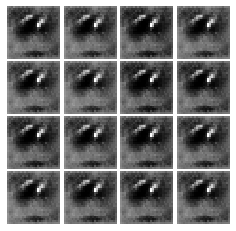

Epoch: 0, Iter: 60, D: 0.4694, G:3.172


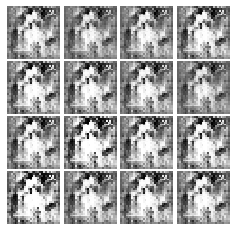

Epoch: 0, Iter: 80, D: 0.5543, G:2.717


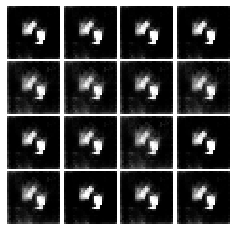

Epoch: 0, Iter: 100, D: 0.1819, G:2.289


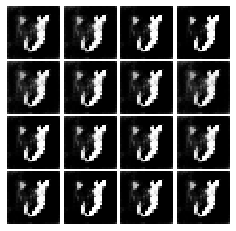

Epoch: 0, Iter: 120, D: 0.2982, G:3.409


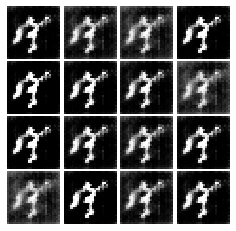

Epoch: 0, Iter: 140, D: 0.3564, G:4.205


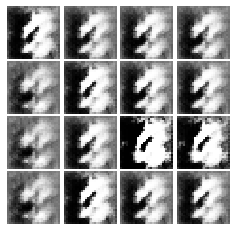

Epoch: 0, Iter: 160, D: 0.6142, G:2.666


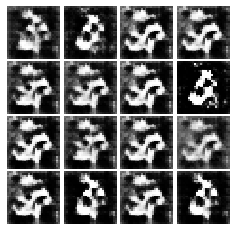

Epoch: 0, Iter: 180, D: 0.7427, G:2.472


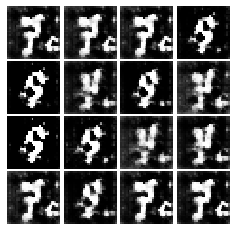

Epoch: 0, Iter: 200, D: 0.26, G:4.076


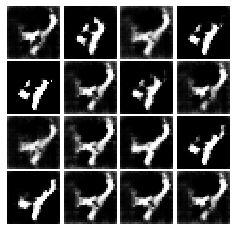

Epoch: 0, Iter: 220, D: 0.2404, G:2.987


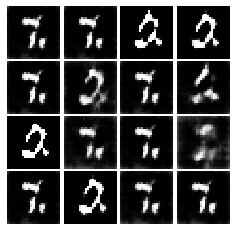

Epoch: 0, Iter: 240, D: 0.7831, G:1.254


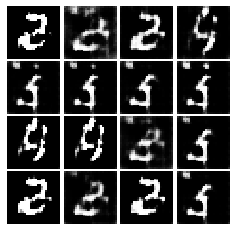

Epoch: 0, Iter: 260, D: 0.6291, G:1.46


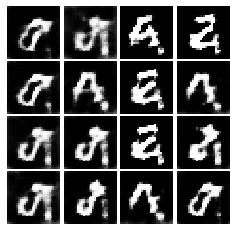

Epoch: 0, Iter: 280, D: 0.7492, G:4.318


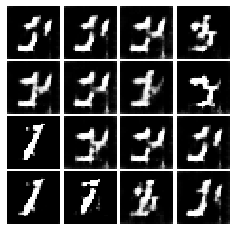

Epoch: 0, Iter: 300, D: 0.6179, G:2.258


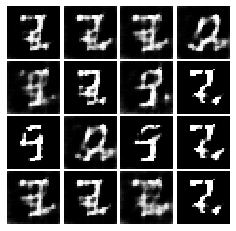

Epoch: 0, Iter: 320, D: 0.5824, G:2.381


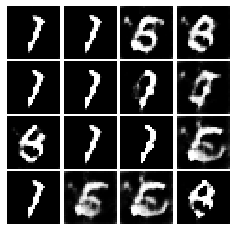

Epoch: 0, Iter: 340, D: 0.4544, G:3.079


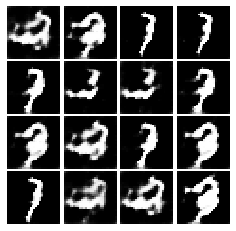

Epoch: 0, Iter: 360, D: 1.65, G:2.202


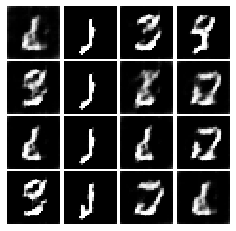

Epoch: 0, Iter: 380, D: 0.9961, G:2.331


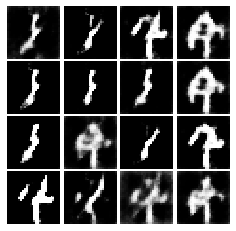

Epoch: 0, Iter: 400, D: 2.236, G:3.476


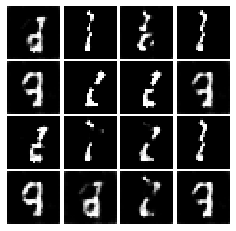

Epoch: 0, Iter: 420, D: 0.4759, G:2.434


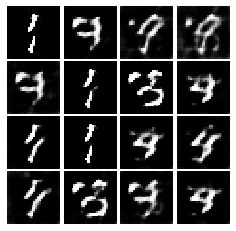

Epoch: 0, Iter: 440, D: 0.7189, G:3.139


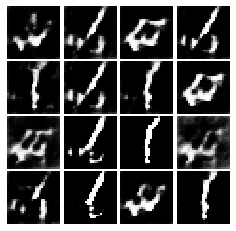

Epoch: 0, Iter: 460, D: 0.6348, G:2.703


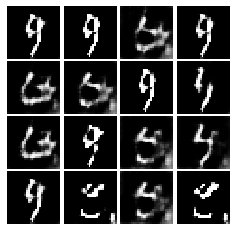

Epoch: 1, Iter: 480, D: 0.3427, G:2.832


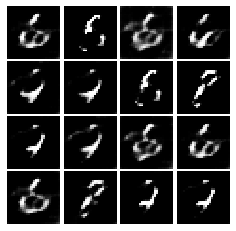

Epoch: 1, Iter: 500, D: 0.3929, G:2.52


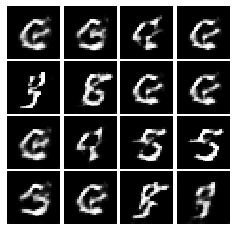

Epoch: 1, Iter: 520, D: 0.6781, G:3.456


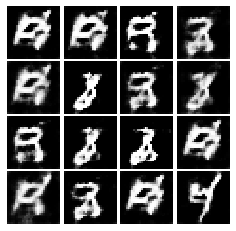

Epoch: 1, Iter: 540, D: 0.5215, G:2.757


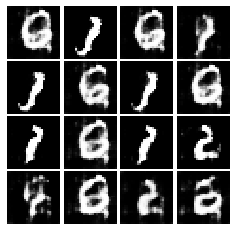

Epoch: 1, Iter: 560, D: 0.4405, G:2.079


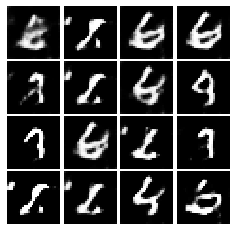

Epoch: 1, Iter: 580, D: 0.3603, G:3.026


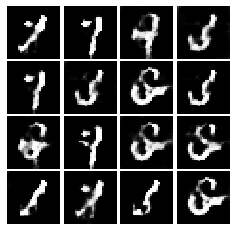

Epoch: 1, Iter: 600, D: 1.141, G:3.39


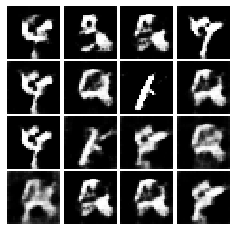

Epoch: 1, Iter: 620, D: 0.7973, G:2.405


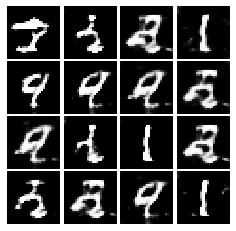

Epoch: 1, Iter: 640, D: 0.7215, G:1.557


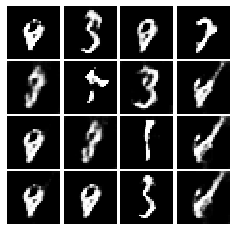

Epoch: 1, Iter: 660, D: 0.429, G:3.55


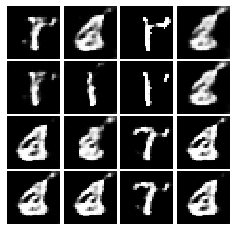

Epoch: 1, Iter: 680, D: 0.3727, G:2.502


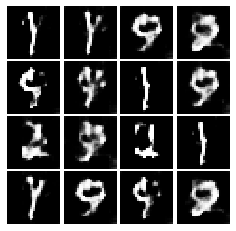

Epoch: 1, Iter: 700, D: 0.5017, G:3.795


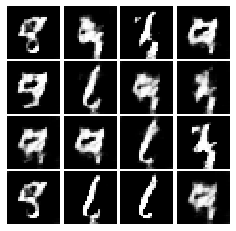

Epoch: 1, Iter: 720, D: 0.3637, G:2.944


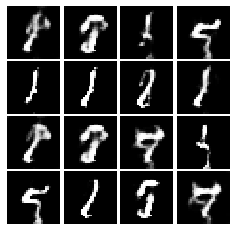

Epoch: 1, Iter: 740, D: 0.792, G:4.205


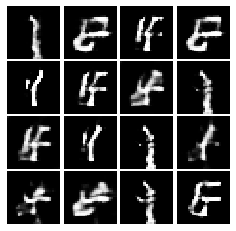

Epoch: 1, Iter: 760, D: 0.4567, G:2.356


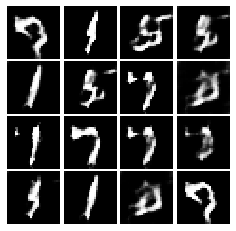

Epoch: 1, Iter: 780, D: 0.4718, G:3.49


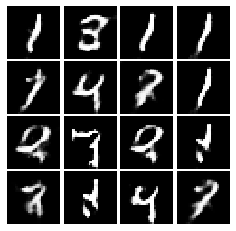

Epoch: 1, Iter: 800, D: 0.5039, G:1.266


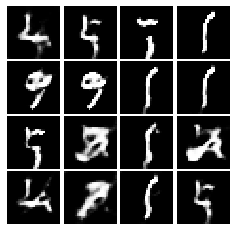

Epoch: 1, Iter: 820, D: 0.4621, G:2.522


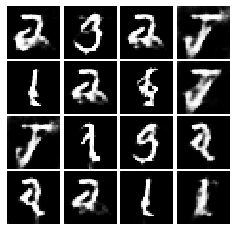

Epoch: 1, Iter: 840, D: 0.5522, G:2.089


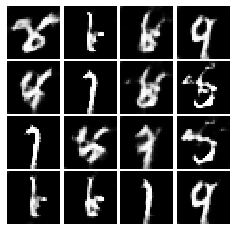

Epoch: 1, Iter: 860, D: 0.8476, G:1.608


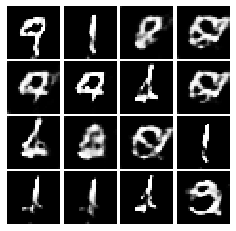

Epoch: 1, Iter: 880, D: 0.469, G:2.663


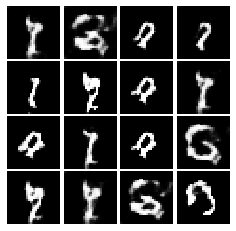

Epoch: 1, Iter: 900, D: 0.414, G:3.205


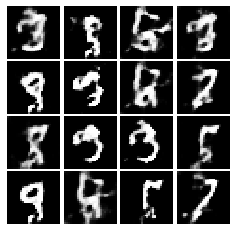

Epoch: 1, Iter: 920, D: 0.4019, G:2.256


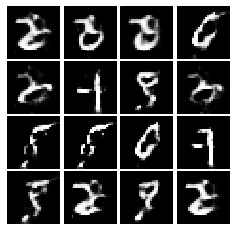

Epoch: 2, Iter: 940, D: 0.2949, G:3.052


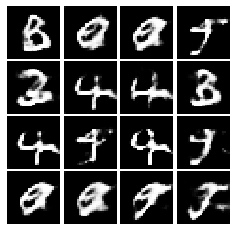

Epoch: 2, Iter: 960, D: 0.6035, G:1.929


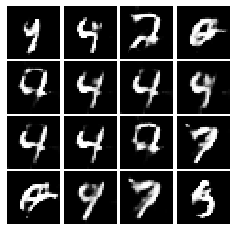

Epoch: 2, Iter: 980, D: 0.6393, G:1.686


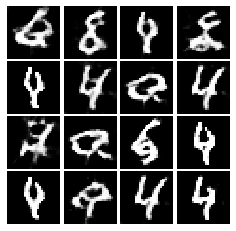

Epoch: 2, Iter: 1000, D: 0.5338, G:2.653


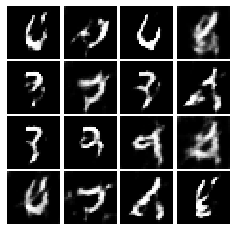

Epoch: 2, Iter: 1020, D: 0.4734, G:2.325


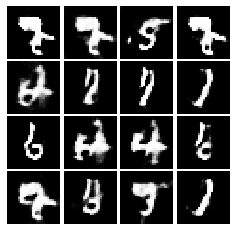

Epoch: 2, Iter: 1040, D: 0.666, G:2.808


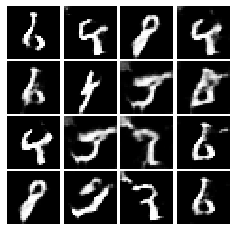

Epoch: 2, Iter: 1060, D: 0.7783, G:1.997


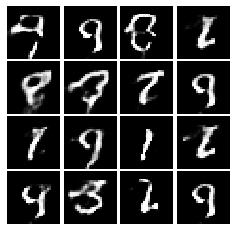

Epoch: 2, Iter: 1080, D: 1.165, G:1.935


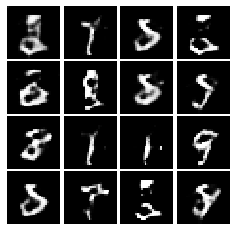

Epoch: 2, Iter: 1100, D: 0.3266, G:3.091


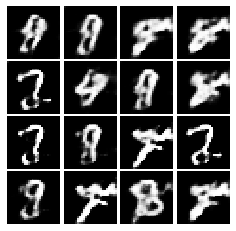

Epoch: 2, Iter: 1120, D: 0.452, G:2.582


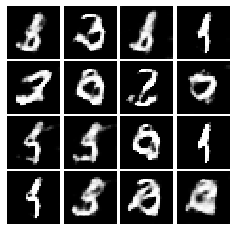

Epoch: 2, Iter: 1140, D: 0.4379, G:2.849


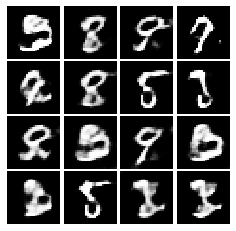

Epoch: 2, Iter: 1160, D: 0.4659, G:2.962


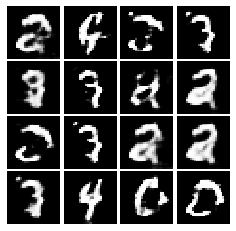

Epoch: 2, Iter: 1180, D: 2.222, G:3.687


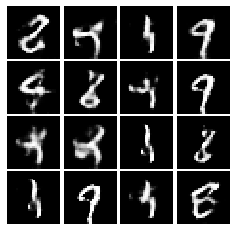

Epoch: 2, Iter: 1200, D: 0.515, G:2.769


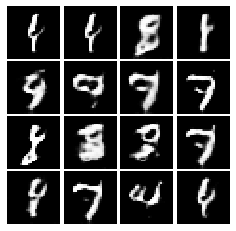

Epoch: 2, Iter: 1220, D: 0.6874, G:1.173


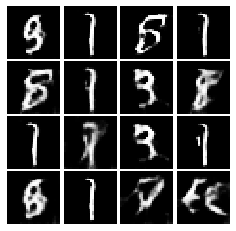

Epoch: 2, Iter: 1240, D: 0.4958, G:2.135


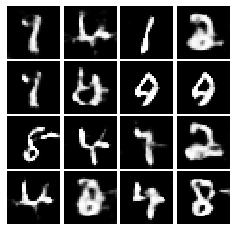

Epoch: 2, Iter: 1260, D: 0.5653, G:2.648


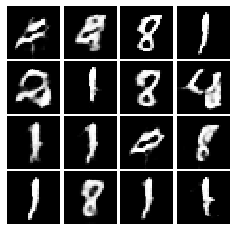

Epoch: 2, Iter: 1280, D: 0.529, G:2.025


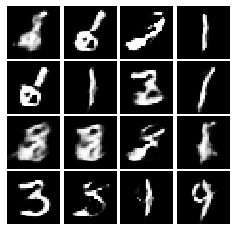

Epoch: 2, Iter: 1300, D: 0.4848, G:3.153


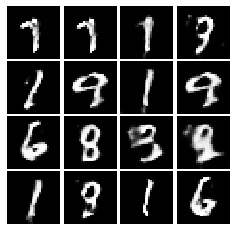

Epoch: 2, Iter: 1320, D: 0.5373, G:2.434


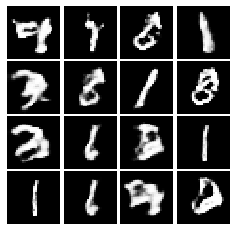

Epoch: 2, Iter: 1340, D: 0.5167, G:2.026


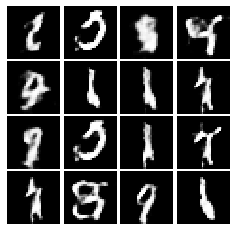

Epoch: 2, Iter: 1360, D: 0.5119, G:1.982


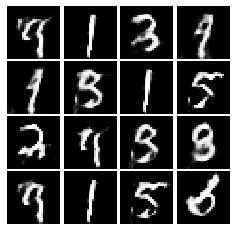

Epoch: 2, Iter: 1380, D: 0.5832, G:2.193


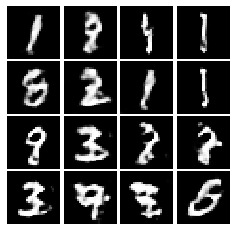

Epoch: 2, Iter: 1400, D: 0.6384, G:2.315


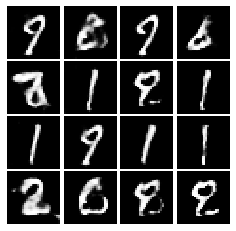

Epoch: 3, Iter: 1420, D: 0.682, G:2.402


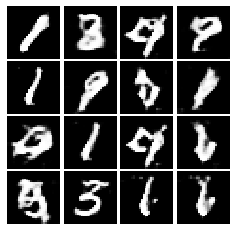

Epoch: 3, Iter: 1440, D: 0.7183, G:2.4


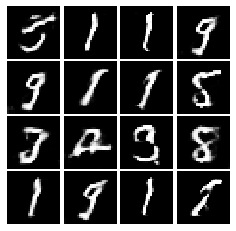

Epoch: 3, Iter: 1460, D: 0.757, G:1.77


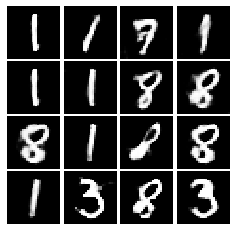

Epoch: 3, Iter: 1480, D: 0.5538, G:2.377


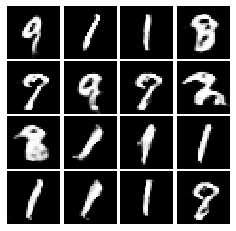

Epoch: 3, Iter: 1500, D: 0.6938, G:1.787


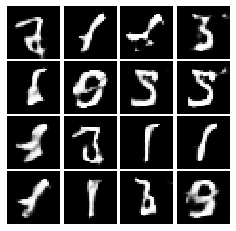

Epoch: 3, Iter: 1520, D: 0.6506, G:2.437


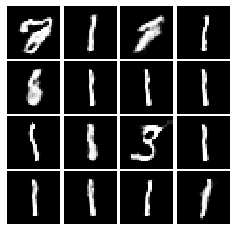

Epoch: 3, Iter: 1540, D: 0.6687, G:1.59


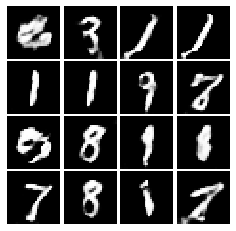

Epoch: 3, Iter: 1560, D: 0.6417, G:2.373


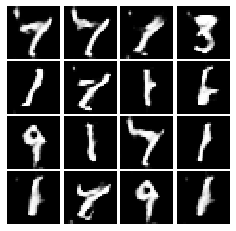

Epoch: 3, Iter: 1580, D: 0.6213, G:1.491


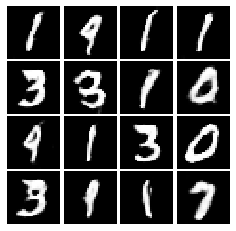

Epoch: 3, Iter: 1600, D: 0.7643, G:1.836


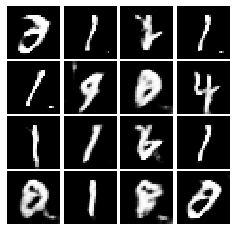

Epoch: 3, Iter: 1620, D: 0.5447, G:1.981


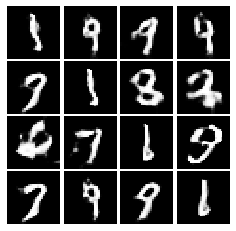

Epoch: 3, Iter: 1640, D: 0.5541, G:2.323


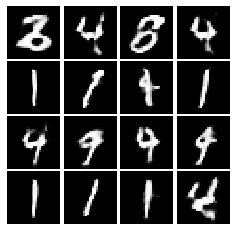

Epoch: 3, Iter: 1660, D: 0.6948, G:2.477


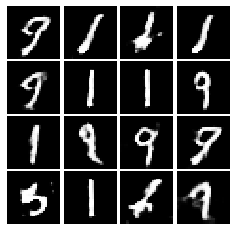

Epoch: 3, Iter: 1680, D: 0.5932, G:1.76


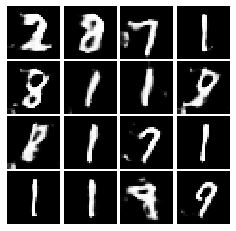

Epoch: 3, Iter: 1700, D: 0.3887, G:2.449


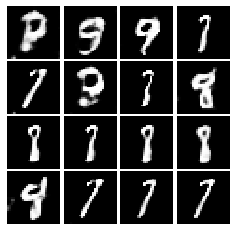

Epoch: 3, Iter: 1720, D: 0.9018, G:3.125


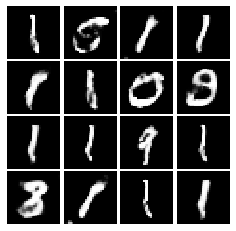

Epoch: 3, Iter: 1740, D: 0.5853, G:2.149


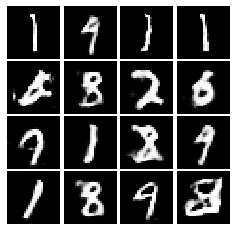

Epoch: 3, Iter: 1760, D: 0.5303, G:2.91


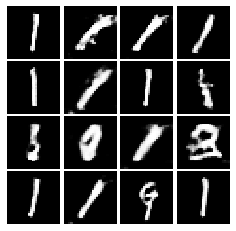

Epoch: 3, Iter: 1780, D: 0.5693, G:1.605


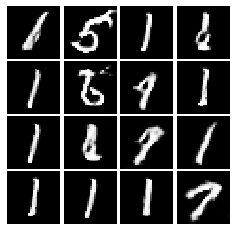

Epoch: 3, Iter: 1800, D: 0.6697, G:1.945


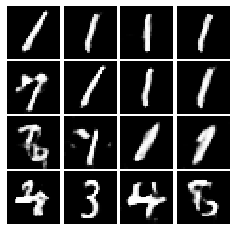

Epoch: 3, Iter: 1820, D: 0.8101, G:1.632


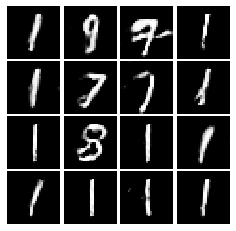

Epoch: 3, Iter: 1840, D: 0.5426, G:2.103


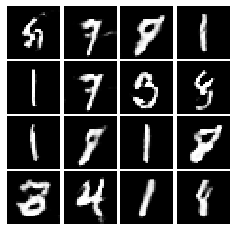

Epoch: 3, Iter: 1860, D: 0.6943, G:1.889


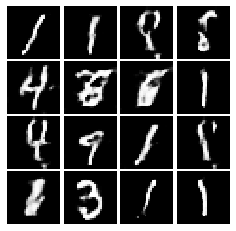

Epoch: 4, Iter: 1880, D: 0.479, G:1.337


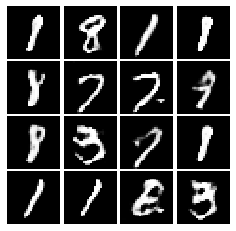

Epoch: 4, Iter: 1900, D: 0.4704, G:2.275


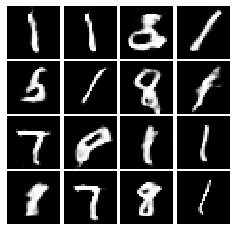

Epoch: 4, Iter: 1920, D: 0.6437, G:2.312


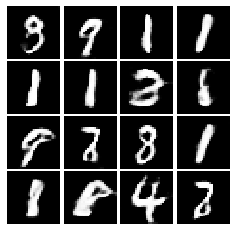

Epoch: 4, Iter: 1940, D: 0.6275, G:2.616


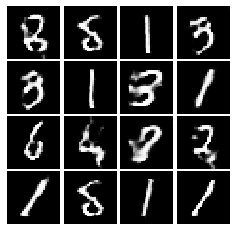

Epoch: 4, Iter: 1960, D: 0.6016, G:2.632


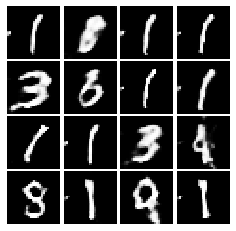

Epoch: 4, Iter: 1980, D: 0.5344, G:1.817


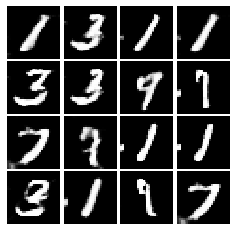

Epoch: 4, Iter: 2000, D: 0.8519, G:1.778


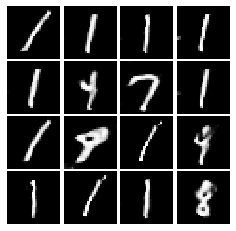

Epoch: 4, Iter: 2020, D: 0.5813, G:2.161


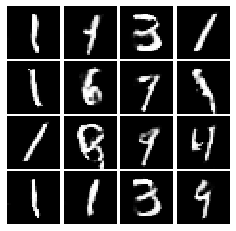

Epoch: 4, Iter: 2040, D: 0.6241, G:1.778


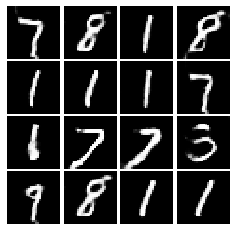

Epoch: 4, Iter: 2060, D: 0.44, G:2.139


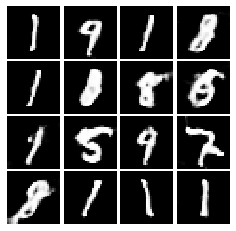

Epoch: 4, Iter: 2080, D: 0.7297, G:2.681


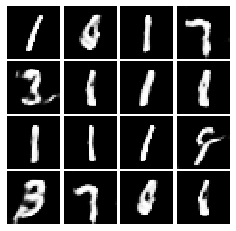

Epoch: 4, Iter: 2100, D: 0.5651, G:2.05


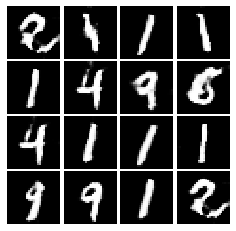

Epoch: 4, Iter: 2120, D: 0.5688, G:1.385


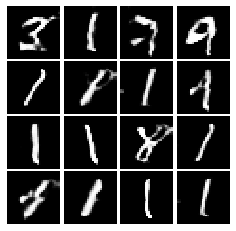

Epoch: 4, Iter: 2140, D: 0.7686, G:1.792


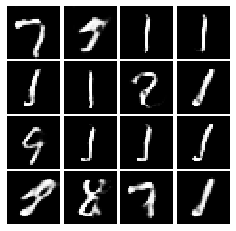

Epoch: 4, Iter: 2160, D: 0.6538, G:1.84


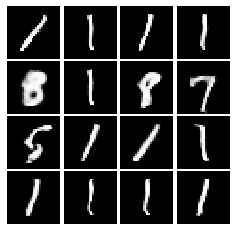

Epoch: 4, Iter: 2180, D: 0.5272, G:2.013


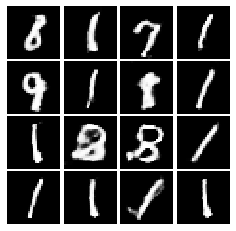

Epoch: 4, Iter: 2200, D: 0.5718, G:2.234


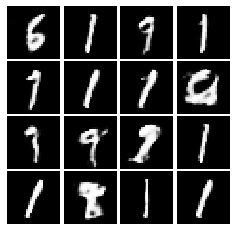

Epoch: 4, Iter: 2220, D: 0.4477, G:2.084


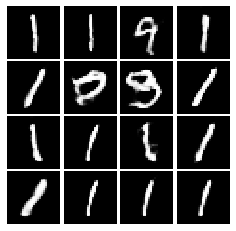

Epoch: 4, Iter: 2240, D: 0.4352, G:1.834


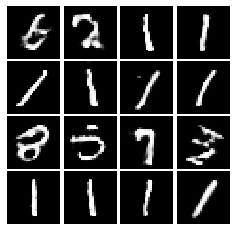

Epoch: 4, Iter: 2260, D: 0.4464, G:2.635


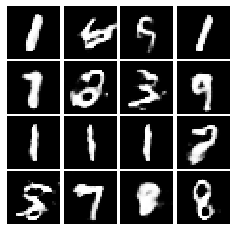

Epoch: 4, Iter: 2280, D: 0.526, G:2.458


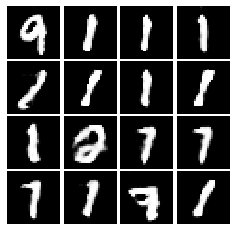

Epoch: 4, Iter: 2300, D: 0.6238, G:2.069


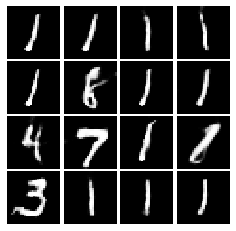

Epoch: 4, Iter: 2320, D: 0.6466, G:2.171


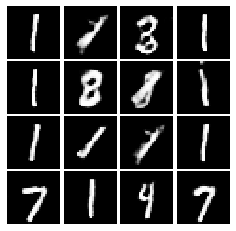

Epoch: 4, Iter: 2340, D: 0.6212, G:2.281


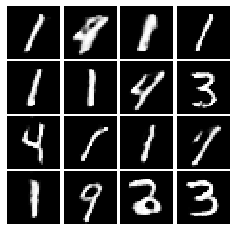

Final images


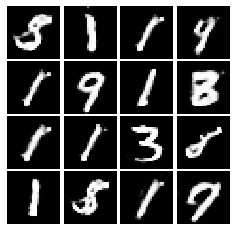

In [33]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |  2    |   1   |  -1   |  -2   |  -1   |   1     
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |  -1   |  -2   |   -1  |   1   |   2   |   1     
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: We will never reach optimal value using this method because the updated variabel values always fluctuate between a set of numbers and remain restricted there unable to find the optimal solution


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: It is not quite good for the discriminator loss to remain high from the start. Discriminator has to improve itself to identify fake image from real at start until the generator gets good enough to fool the discriminator and then can the discriminator loss remain high
